# 05d Main analyses with all covariates
Same as main 05a script but edited so that covariates aren't dropped and the results for the whole model are saved instead

In [1]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import numpy as np;
import pandas as pd;
from sklearn import preprocessing 
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import itertools
import pickle

import scipy; # for spearmann correlation



C:\Users\Lauren.Koenig\AppData\Roaming\Python\Python39\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# read in and clean data

In [2]:
data_folder_loc = '//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/'
code_folder_loc = '//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/'

In [3]:
# read in data
composite_rr, pons_rr, para_rr, new_para_rr, ras_rr = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [4]:
all_data = new_para_rr #[~new_para_rr['ID_ADM'].isin(['APE-792_23', 'APE-792_35', 'APE-792_39', 'APE-792_65', 'APE-792_71', 'RIL_17', 'RIL_21', 'RIL_24', 'APE-792_9','APE-792_22', 'RIL_13'])].copy()#
data_name = 'new_para_rr'

In [5]:
# orig has additional 
# 
# pons (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal', 'Avg PCC'
# para (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal'

# para (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg PCC', 'Avg_MedOrbFrontal'
# para (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm'

# ras (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg_MedOrbFrontal'
# ras (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm', 'CO', 'Graycer-gm', 'Vermis-gm'

In [6]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']

In [7]:
all_data['missing_vars'] = all_data.isna().sum(axis =1)
all_data['missing_vars2'] = all_data[ [ele for ele in FDG_columns if ele in all_data.columns] + plasma_columns].isna().sum(axis =1)
all_data = all_data.sort_values('missing_vars2').drop_duplicates(subset = ['ID_ADM','timepoint'])

## make data subsets

In [8]:
# make data subsets
# baseline and non-trial data
baseline_data = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]

# baseline only
baseline_trial_data = all_data[all_data['timepoint'].isin(['base'])]

# baseline only and only age 70-80
baseline_trial_data_70_80 = baseline_trial_data[(baseline_trial_data['age']<=80) & (baseline_trial_data['age']>=70)]

# Analyses

## version using raw plasma data

In [9]:
covariate_p_threshold = 0.05

In [10]:
biomarker_relationship_results_raw = pd.DataFrame()


for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], plasma_columns, cog_columns, vol_columns]:
    combinations = pd.DataFrame(list(itertools.product(plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        x_var = combinations[0][idx]
        y_var = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [y_var, x_var])

        # z-score data
        temp_df_baseline[[y_var, x_var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[y_var, x_var, 'Education_years', 'age']])

        # run 1 - check for significant covariates
        sig_pvals_unique = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race', x_var]
        
        # run 2 -with just the significant covariates (but forcing the x_var to be included)
        model_vars = ' + '.join(sig_pvals_unique)        
        model = smf.ols(formula = y_var + ' ~ ' + model_vars , data = temp_df_baseline).fit()

        model_p_val_baseline = model.pvalues
        model_B_val_baseline = model.params
        model_n_baseline = len(temp_df_baseline.dropna(subset = sig_pvals_unique + [y_var]))


        # save results
        temp_results  =  pd.DataFrame([y_var, x_var, model_p_val_baseline, model_B_val_baseline, model_n_baseline]).T

        temp_results.columns = ['y_var', 'x_var', 
        'model_p_val_baseline', 'model_B_val_baseline', 'model_n_baseline']
        
        # separate out p and B values into separate columns
        df_mv_age_pvals = pd.DataFrame(temp_results['model_p_val_baseline'][0]).T
        df_mv_age_pvals.columns = 'model_p_val_' + df_mv_age_pvals.columns
        temp_results[df_mv_age_pvals.columns] = df_mv_age_pvals

        df_mv_age_bvals = pd.DataFrame(temp_results['model_B_val_baseline'][0]).T
        df_mv_age_bvals.columns = 'model_B_val_' + df_mv_age_bvals.columns
        temp_results[df_mv_age_bvals.columns] = df_mv_age_bvals                
        
        # remove self-correlations
        temp_results = temp_results[~(temp_results['y_var'] == temp_results['x_var'])]

        # rename so var2 is in the same column
        temp_results = temp_results.rename(columns = dict(zip(temp_results.columns, [ele.replace(x_var, 'x_var') for ele in temp_results.columns ])))

        # add to full list of results
        biomarker_relationship_results_raw = pd.concat([biomarker_relationship_results_raw, temp_results])


In [11]:
selected_p_column = ['model_p_val_x_var']

# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_raw['y_var'].drop_duplicates().to_list():
#    biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin([y_var]), selected_p_column] = biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin([y_var]), selected_p_column].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])


In [12]:
biomarker_relationship_results_raw['type'] = 'other'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin(plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['y_var'].isin(vol_columns), 'type'] = 'Volumetric'

In [13]:
biomarker_relationship_results_raw

,y_var,x_var,model_p_val_baseline,model_B_val_baseline,model_n_baseline,model_p_val_Intercept,model_p_val_apoe4_carrier[T.Yes],model_p_val_sex[T.M],model_p_val_race[T.White/NH],model_p_val_age,model_p_val_Education_years,model_p_val_x_var,model_B_val_Intercept,model_B_val_apoe4_carrier[T.Yes],model_B_val_sex[T.M],model_B_val_race[T.White/NH],model_B_val_age,model_B_val_Education_years,model_B_val_x_var,type
0,MTL_gm,Ab40,Intercept 0.072742 apoe4_carrier...,Intercept -1.687562 apoe4_carrier...,34,0.072742,0.569573,0.312999,0.066075,0.860165,0.005767,0.776081,-1.687562,-0.176508,0.332348,1.759247,-0.032148,0.546910,-0.041621,FDG PET
0,SensMot_gm,Ab40,Intercept 0.371980 apoe4_carrier...,Intercept -0.959124 apoe4_carrier...,34,0.371980,0.457440,0.762152,0.252370,0.339422,0.364673,0.030691,-0.959124,-0.270200,-0.115531,1.255786,0.205498,0.196599,0.386229,FDG PET
0,FRONTAL_gm,Ab40,Intercept 0.376344 apoe4_carrier...,Intercept -0.967226 apoe4_carrier...,34,0.376344,0.953364,0.211688,0.311700,0.087098,0.010080,0.937496,-0.967226,0.021534,-0.492036,1.126660,0.381852,0.600579,0.013644,FDG PET
0,AC_gm,Ab40,Intercept 0.252074 apoe4_carrier...,Intercept -1.194009 apoe4_carrier...,34,0.252074,0.320047,0.233458,0.231246,0.781847,0.031417,0.983020,-1.194009,0.350606,-0.444754,1.269821,-0.057071,0.467357,-0.003513,FDG PET
0,Precun_gm,Ab40,Intercept 0.772040 apoe4_carrier...,Intercept -0.316778 apoe4_carrier...,34,0.772040,0.533475,0.380506,0.632567,0.060463,0.014003,0.686471,-0.316778,-0.231659,-0.345212,0.532027,0.424241,0.574099,-0.070808,FDG PET
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,VOL_Precun_InfPar_Supramarg_Rz,pTau181_Ab42,Intercept 0.796531 apoe4_carrier...,Intercept -0.248866 apoe4_carrier...,25,0.796531,0.448053,0.108492,0.525753,0.013743,0.004267,0.018196,-0.248866,-0.288508,-0.637880,0.627699,0.671252,0.795737,0.507197,Volumetric
0,VOL_LatOccLingCun_Lz,pTau181_Ab42,Intercept 0.501039 apoe4_carrier...,Intercept -0.724121 apoe4_carrier...,25,0.501039,0.084320,0.971605,0.335722,0.144597,0.104074,0.008180,-0.724121,-0.753620,-0.015117,1.063961,0.415820,0.462157,0.643364,Volumetric
0,VOL_LatOccLingCun_Rz,pTau181_Ab42,Intercept 0.415066 apoe4_carrier...,Intercept -0.911227 apoe4_carrier...,25,0.415066,0.171443,0.821358,0.282050,0.471794,0.155685,0.018585,-0.911227,-0.608538,0.099392,1.235536,0.207564,0.414328,0.580274,Volumetric
0,VOL_InfParSupra_Lz,pTau181_Ab42,Intercept 0.484313 apoe4_carrier...,Intercept -0.755438 apoe4_carrier...,25,0.484313,0.915737,0.539347,0.463450,0.008245,0.054760,0.086230,-0.755438,-0.044399,-0.262894,0.808383,0.811650,0.556321,0.394226,Volumetric


## version using log10 plasma data

In [14]:
biomarker_relationship_results_log10 = pd.DataFrame()


for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], log10_plasma_columns, cog_columns, vol_columns]:
    combinations = pd.DataFrame(list(itertools.product(log10_plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        x_var = combinations[0][idx]
        y_var = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [y_var, x_var])

        # z-score data
        temp_df_baseline[[y_var, x_var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[y_var, x_var, 'Education_years', 'age']])

        # run 1 - check for significant covariates
        sig_pvals_unique = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race', x_var]
        
        # run 2 -with just the significant covariates (but forcing the x_var to be included)
        model_vars = ' + '.join(sig_pvals_unique)        
        model = smf.ols(formula = y_var + ' ~ ' + model_vars , data = temp_df_baseline).fit()

        model_p_val_baseline = model.pvalues
        model_B_val_baseline = model.params
        model_n_baseline = len(temp_df_baseline.dropna(subset = sig_pvals_unique + [y_var]))


        # save results
        temp_results  =  pd.DataFrame([y_var, x_var, model_p_val_baseline, model_B_val_baseline, model_n_baseline]).T

        temp_results.columns = ['y_var', 'x_var', 
        'model_p_val_baseline', 'model_B_val_baseline', 'model_n_baseline']
        
        # separate out p and B values into separate columns
        df_mv_age_pvals = pd.DataFrame(temp_results['model_p_val_baseline'][0]).T
        df_mv_age_pvals.columns = 'model_p_val_' + df_mv_age_pvals.columns
        temp_results[df_mv_age_pvals.columns] = df_mv_age_pvals

        df_mv_age_bvals = pd.DataFrame(temp_results['model_B_val_baseline'][0]).T
        df_mv_age_bvals.columns = 'model_B_val_' + df_mv_age_bvals.columns
        temp_results[df_mv_age_bvals.columns] = df_mv_age_bvals                
        
        # remove self-correlations
        temp_results = temp_results[~(temp_results['y_var'] == temp_results['x_var'])]

        # rename so var2 is in the same column
        temp_results = temp_results.rename(columns = dict(zip(temp_results.columns, [ele.replace(x_var, 'x_var') for ele in temp_results.columns ])))

        # add to full list of results
        biomarker_relationship_results_log10 = pd.concat([biomarker_relationship_results_log10, temp_results])


In [15]:
selected_p_column = ['model_p_val_x_var']

In [16]:
# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_log10['y_var'].drop_duplicates().to_list():
#    biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]), selected_p_column] = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]), selected_p_column].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])

In [17]:
biomarker_relationship_results_log10['type'] = 'other'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(log10_plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(vol_columns), 'type'] = 'Volumetric'

In [18]:
biomarker_relationship_results_log10['type'].value_counts()

type
Volumetric    693
Cognitive     108
FDG PET        90
Plasma         72
Name: count, dtype: int64

## compare raw and log10 plasma results

In [19]:
temp_a = biomarker_relationship_results_raw[['y_var', 'x_var'] + selected_p_column].copy()
temp_b = biomarker_relationship_results_log10[['y_var', 'x_var'] + selected_p_column].copy()

temp_a[selected_p_column] = temp_a[selected_p_column]< 0.05
temp_b[selected_p_column] = temp_b[selected_p_column]< 0.05


temp_a = temp_a.replace({True:1, False:0})
temp_b = temp_b.replace({True:1, False:0})

temp_c = temp_a.copy()
temp_c[selected_p_column] = (temp_a[selected_p_column] - temp_b[selected_p_column])

temp_c[(temp_c[selected_p_column] != 0).any(axis = 1)]

# 0 means they were the same; 1 means A was sig but B wasn't; -1 means B was significant but A wasn't

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\213106404.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\213106404.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


,y_var,x_var,model_p_val_x_var
0,MTL_gm,pTau231,1
0,PostCing_gm,pTau181_Ab42,1
0,pTau231,NFL,1
0,NFL,pTau231,1
0,cowattotal,GFAP,1
0,adltotal,pTau181,-1
0,adltotal,pTau181_Ab42,-1
0,VOL_MidTemp_Lz,Ab40,1
0,VOL_InfPar_Lz,Ab40,1
0,VOL_Insula_Rz,Ab40,1


In [20]:
temp_c[selected_p_column].melt().value_counts().sort_index()

variable           value
model_p_val_x_var  -1        20
                    0       921
                    1        22
Name: count, dtype: int64

In [21]:
temp_c.loc[~(temp_c['y_var'].isin( [ele for ele in FDG_columns if ele in all_data.columns]) & temp_c['x_var'].isin( [ele for ele in FDG_columns if ele in all_data.columns]))  ,selected_p_column].melt().value_counts().sort_index()

variable           value
model_p_val_x_var  -1        20
                    0       921
                    1        22
Name: count, dtype: int64

In [22]:
biomarker_relationship_results_raw.columns

Index(['y_var', 'x_var', 'model_p_val_baseline', 'model_B_val_baseline',
       'model_n_baseline', 'model_p_val_Intercept',
       'model_p_val_apoe4_carrier[T.Yes]', 'model_p_val_sex[T.M]',
       'model_p_val_race[T.White/NH]', 'model_p_val_age',
       'model_p_val_Education_years', 'model_p_val_x_var',
       'model_B_val_Intercept', 'model_B_val_apoe4_carrier[T.Yes]',
       'model_B_val_sex[T.M]', 'model_B_val_race[T.White/NH]',
       'model_B_val_age', 'model_B_val_Education_years', 'model_B_val_x_var',
       'type'],
      dtype='object')

In [23]:
# the significant pvalues lost by the log transform
biomarker_relationship_results_raw.loc[(temp_c['model_p_val_x_var'] == 1), ['y_var', 'x_var', 'model_p_val_x_var', 'model_B_val_x_var']].round(3)

,y_var,x_var,model_p_val_x_var,model_B_val_x_var
0,MTL_gm,pTau231,0.029,0.299
0,PostCing_gm,pTau181_Ab42,0.049,0.430
0,pTau231,NFL,0.018,0.476
0,NFL,pTau231,0.018,0.444
0,cowattotal,GFAP,0.025,-0.373
0,VOL_MidTemp_Lz,Ab40,0.011,-0.430
0,VOL_InfPar_Lz,Ab40,0.011,-0.467
0,VOL_Insula_Rz,Ab40,0.023,-0.466
0,VOL_LatTemp_Lz,Ab40,0.033,-0.444
0,VOL_InfMidTemp_Lz,Ab40,0.035,-0.415


In [24]:
biomarker_relationship_results_log10.loc[(temp_c['model_p_val_x_var'] == 1), ['y_var', 'x_var', 'model_p_val_x_var', 'model_B_val_x_var']].round(3)

,y_var,x_var,model_p_val_x_var,model_B_val_x_var
0,MTL_gm,pTau231_log10,0.072,0.257
0,PostCing_gm,pTau181_Ab42_log10,0.080,0.386
0,pTau231_log10,NFL_log10,0.069,0.357
0,NFL_log10,pTau231_log10,0.069,0.368
0,cowattotal,GFAP_log10,0.054,-0.328
0,VOL_MidTemp_Lz,Ab40_log10,0.074,-0.305
0,VOL_InfPar_Lz,Ab40_log10,0.087,-0.318
0,VOL_Insula_Rz,Ab40_log10,0.070,-0.370
0,VOL_LatTemp_Lz,Ab40_log10,0.134,-0.312
0,VOL_InfMidTemp_Lz,Ab40_log10,0.112,-0.312


In [25]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_raw.loc[(temp_c['model_p_val_x_var'] == -1), ['y_var', 'x_var', 'model_p_val_x_var', 'model_B_val_x_var']].round(3)

,y_var,x_var,model_p_val_x_var,model_B_val_x_var
0,adltotal,pTau181,0.136,0.273
0,adltotal,pTau181_Ab42,0.075,0.377
0,VOL_Pericalc_Rz,Ab42,0.070,0.411
0,VOL_Cuneus_Rz,pTau181,0.051,0.419
0,VOL_LatOccLingCun_Lz,pTau181,0.105,0.351
0,VOL_LatOccLingCun_Rz,pTau181,0.059,0.411
0,VOL_ParaHip_Rz,pTau231,0.107,0.340
0,VOL_OrbitFront_Lz,pTau231,0.058,0.400
0,VOL_Cuneus_Rz,pTau231,0.126,0.321
0,VOL_Fusi_Rz,pTau181_Ab42,0.097,0.416


In [26]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_log10.loc[(temp_c['model_p_val_x_var'] == -1), ['y_var', 'x_var', 'model_p_val_x_var', 'model_B_val_x_var']].round(3)

,y_var,x_var,model_p_val_x_var,model_B_val_x_var
0,adltotal,pTau181_log10,0.031,0.395
0,adltotal,pTau181_Ab42_log10,0.035,0.439
0,VOL_Pericalc_Rz,Ab42_log10,0.038,0.465
0,VOL_Cuneus_Rz,pTau181_log10,0.011,0.546
0,VOL_LatOccLingCun_Lz,pTau181_log10,0.044,0.444
0,VOL_LatOccLingCun_Rz,pTau181_log10,0.020,0.515
0,VOL_ParaHip_Rz,pTau231_log10,0.042,0.423
0,VOL_OrbitFront_Lz,pTau231_log10,0.042,0.429
0,VOL_Cuneus_Rz,pTau231_log10,0.040,0.423
0,VOL_Fusi_Rz,pTau181_Ab42_log10,0.036,0.518


# save results

In [27]:
'''with pd.ExcelWriter(code_folder_loc + 'output/05d_model_results_raw_all_covariates_' + data_name +'.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab40'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab42'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab42_40'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau181'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau217'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau231'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['GFAP'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['NFL'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau181_Ab42'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_raw[(biomarker_relationship_results_raw[selected_p_column].min(axis = 1)<0.05)].to_excel(writer, sheet_name='Significant', index=False)'''

"with pd.ExcelWriter(code_folder_loc + 'output/05d_model_results_raw_all_covariates_' + data_name +'.xlsx') as writer:\n   \n    # use to_excel function and specify the sheet_name and index \n    # to store the dataframe in specified sheet\n    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab40'])].to_excel(writer, sheet_name='Ab40', index=False)\n    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab42'])].to_excel(writer, sheet_name='Ab42', index=False)\n    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['Ab42_40'])].to_excel(writer, sheet_name='Ab42_40', index=False)\n    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau181'])].to_excel(writer, sheet_name='pTau181', index=False)\n    biomarker_relationship_results_raw[biomarker_relationship_results_raw['x_var'].isin(['pTau217'])].to_excel(writer, sheet_name='pTau217', index=Fals

In [28]:
'''with pd.ExcelWriter(code_folder_loc + 'output/05d_model_results_log10_all_covariates_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab40_log10'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab42_log10'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab42_40_log10'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau181_log10'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau217_log10'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau231_log10'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['GFAP_log10'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['NFL_log10'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau181_Ab42_log10'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_log10.loc[(biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<0.05), :].to_excel(writer, sheet_name='Significant', index=False)'''

"with pd.ExcelWriter(code_folder_loc + 'output/05d_model_results_log10_all_covariates_' + data_name + '.xlsx') as writer:\n   \n    # use to_excel function and specify the sheet_name and index \n    # to store the dataframe in specified sheet\n    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab40_log10'])].to_excel(writer, sheet_name='Ab40', index=False)\n    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab42_log10'])].to_excel(writer, sheet_name='Ab42', index=False)\n    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['Ab42_40_log10'])].to_excel(writer, sheet_name='Ab42_40', index=False)\n    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau181_log10'])].to_excel(writer, sheet_name='pTau181', index=False)\n    biomarker_relationship_results_log10[biomarker_relationship_results_log10['x_var'].isin(['pTau217_log10'

In [29]:
full_names = pd.read_csv(code_folder_loc + 'data/data-dictionary.csv')
full_names = dict(zip(full_names['variable_name'], full_names['full_name']))

In [30]:
full_names

{'MTL_gm': 'Medial Temporal FDG PET SUVR',
 'SensMot_gm': 'Sensorimotor FDG PET SUVR',
 'FRONTAL_gm': 'Frontal FDG PET SUVR',
 'AC_gm': 'Anterior Cingulate FDG PET SUVR',
 'Precun_gm': 'Precuneus FDG PET SUVR',
 'Par_gm': 'Inferior Parietal FDG PET SUVR',
 'Temp_gm': 'Lateral Temporal FDG PET SUVR',
 'PostCing_gm': 'Posterior Cingulate FDG PET SUVR',
 'GFAP': 'Plasma GFAP',
 'NFL': 'Plasma NFL',
 'Ab40': 'Plasma Amyloid-Beta 40',
 'Ab42': 'Plasma Amyloid-Beta 42',
 'Ab42_40': 'Plasma Amyloid-Beta 42/40',
 'pTau181': 'Plasma P-tau 181',
 'pTau217': 'Plasma P-tau 217',
 'pTau231': 'Plasma P-tau 231',
 'GFAP_log10': 'Plasma GFAP (log10)',
 'NFL_log10': 'Plasma NFL (log10)',
 'Ab40_log10': 'Plasma Amyloid-Beta 40 (log10)',
 'Ab42_log10': 'Plasma Amyloid-Beta 42 (log10)',
 'Ab42_40_log10': 'Plasma Amyloid-Beta 42/40 (log10)',
 'pTau181_log10': 'Plasma P-tau 181 (log10)',
 'pTau217_log10': 'Plasma P-tau 217 (log10)',
 'pTau231_log10': 'Plasma P-tau 231 (log10)',
 'MMSE': 'Mini Mental State E

In [31]:
temp_df = biomarker_relationship_results_log10.copy()
temp_df = temp_df[temp_df['x_var'].isin(['Ab42_40_log10', 'GFAP_log10', 'NFL_log10', 'pTau181_log10', 'pTau217_log10', 'pTau231_log10'])]
temp_df = temp_df[~temp_df['y_var'].isin(['RASref1_gm', 'Paracentral_gm', 'Ab42_log10', 'pTau181_Ab42_log10', 'Ab40_log10'])]

temp_df = temp_df[[
'type', 'y_var', 'x_var','model_n_baseline', 
'model_B_val_x_var', 'model_p_val_x_var',
'model_B_val_age',  'model_p_val_age',
'model_B_val_Education_years', 'model_p_val_Education_years', 
'model_B_val_apoe4_carrier[T.Yes]','model_p_val_apoe4_carrier[T.Yes]', 
'model_B_val_race[T.White/NH]',  'model_p_val_race[T.White/NH]', 
'model_B_val_sex[T.M]','model_p_val_sex[T.M]', 
'model_B_val_Intercept','model_p_val_Intercept'
]]

temp_df = temp_df.replace({0.0:'<0.001'})

temp_df[['model_B_val_x_var', 'model_B_val_age',  'model_B_val_Education_years',
'model_B_val_apoe4_carrier[T.Yes]','model_B_val_race[T.White/NH]',  'model_B_val_sex[T.M]','model_B_val_Intercept']] = temp_df[[
    'model_B_val_x_var', 'model_B_val_age',  'model_B_val_Education_years',
'model_B_val_apoe4_carrier[T.Yes]','model_B_val_race[T.White/NH]',  'model_B_val_sex[T.M]','model_B_val_Intercept']].round(2)

temp_df[['model_p_val_x_var','model_p_val_age',  'model_p_val_Education_years', 
'model_p_val_apoe4_carrier[T.Yes]', 'model_p_val_race[T.White/NH]', 'model_p_val_sex[T.M]', 'model_p_val_Intercept']] = temp_df[['model_p_val_x_var','model_p_val_age',  'model_p_val_Education_years', 
'model_p_val_apoe4_carrier[T.Yes]', 'model_p_val_race[T.White/NH]', 'model_p_val_sex[T.M]', 'model_p_val_Intercept']].round(5)


temp_df = temp_df.rename(columns = {
'model_n_baseline':'number of subjects'})

temp_df = temp_df.rename(columns = dict(zip(temp_df.columns, [ele.replace('model_', '') for ele in temp_df.columns])))


temp_df['x_var'] = temp_df['x_var'].replace(full_names)
temp_df['y_var'] = temp_df['y_var'].replace(full_names)
temp_df.columns = temp_df.columns.str.replace('B_val', 'beta_val')

with pd.ExcelWriter(code_folder_loc + 'output/05d_supplemental_full_results_all_covariates_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    temp_df[temp_df['x_var'].isin(['Plasma P-tau 217 (log10)'])].to_excel(writer, sheet_name='pTau217', index=False)
    temp_df[temp_df['x_var'].isin(['Plasma GFAP (log10)'])].to_excel(writer, sheet_name='GFAP', index=False)
    temp_df[temp_df['x_var'].isin(['Plasma NFL (log10)'])].to_excel(writer, sheet_name='NFL', index=False)
    temp_df[temp_df['x_var'].isin(['Plasma Amyloid-Beta 42/40 (log10)'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    temp_df[temp_df['x_var'].isin(['Plasma P-tau 181 (log10)'])].to_excel(writer, sheet_name='pTau181', index=False)
    temp_df[temp_df['x_var'].isin(['Plasma P-tau 231 (log10)'])].to_excel(writer, sheet_name='pTau231', index=False)
    temp_df.loc[(temp_df['p_val_x_var'].replace({'<0.001':0.0})<0.05), :].to_excel(writer, sheet_name='Significant', index=False)


temp_df

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\3425531932.py:16: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


,type,y_var,x_var,number of subjects,beta_val_x_var,p_val_x_var,beta_val_age,p_val_age,beta_val_Education_years,p_val_Education_years,beta_val_apoe4_carrier[T.Yes],p_val_apoe4_carrier[T.Yes],beta_val_race[T.White/NH],p_val_race[T.White/NH],beta_val_sex[T.M],p_val_sex[T.M],beta_val_Intercept,p_val_Intercept
0,FDG PET,Medial Temporal FDG PET SUVR,Plasma Amyloid-Beta 42/40 (log10),30,0.26,0.09449,-0.13,0.46102,0.44,0.01736,-0.43,0.15495,1.41,0.11310,0.12,0.72672,-1.11,0.21123
0,FDG PET,Sensorimotor FDG PET SUVR,Plasma Amyloid-Beta 42/40 (log10),30,0.06,0.77956,0.30,0.20028,0.18,0.44719,-0.59,0.14470,1.12,0.33922,-0.38,0.40384,-0.51,0.66185
0,FDG PET,Frontal FDG PET SUVR,Plasma Amyloid-Beta 42/40 (log10),30,0.03,0.88819,0.61,0.01169,0.58,0.01457,0.04,0.92629,1.30,0.24960,-0.43,0.32548,-1.16,0.30486
0,FDG PET,Anterior Cingulate FDG PET SUVR,Plasma Amyloid-Beta 42/40 (log10),30,-0.01,0.96870,0.07,0.74861,0.42,0.06402,0.30,0.43510,1.67,0.13852,-0.36,0.40907,-1.55,0.16964
0,FDG PET,Precuneus FDG PET SUVR,Plasma Amyloid-Beta 42/40 (log10),30,0.51,0.00895,0.49,0.02661,0.52,0.01767,-0.18,0.62097,-0.32,0.75858,-0.73,0.07864,0.61,0.55749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,Volumetric,Right Combined Precuneus + Inferior Parietal +...,Plasma P-tau 231 (log10),27,0.40,0.02164,0.66,0.00141,0.46,0.02036,-0.13,0.70009,0.25,0.78179,-0.34,0.33268,-0.11,0.90082
0,Volumetric,Left Lateral Occipital + Lingual + Cuneus Volu...,Plasma P-tau 231 (log10),27,0.46,0.02463,0.33,0.13647,0.19,0.38209,-0.44,0.29753,0.64,0.56398,0.08,0.84732,-0.55,0.60916
0,Volumetric,Right Lateral Occipital + Lingual + Cuneus Vol...,Plasma P-tau 231 (log10),27,0.57,0.00434,0.29,0.14940,0.33,0.11709,-0.28,0.47237,1.04,0.31143,0.35,0.36931,-1.05,0.29705
0,Volumetric,Left Combined Inferior Parietal + Supramargina...,Plasma P-tau 231 (log10),27,0.30,0.06504,0.75,0.00026,0.25,0.15975,-0.15,0.65937,0.66,0.45536,0.04,0.89408,-0.66,0.44251


In [32]:
temp_df[temp_df['p_val_x_var']< 0.001].replace({0.0:'<0.001'})

,type,y_var,x_var,number of subjects,beta_val_x_var,p_val_x_var,beta_val_age,p_val_age,beta_val_Education_years,p_val_Education_years,beta_val_apoe4_carrier[T.Yes],p_val_apoe4_carrier[T.Yes],beta_val_race[T.White/NH],p_val_race[T.White/NH],beta_val_sex[T.M],p_val_sex[T.M],beta_val_Intercept,p_val_Intercept
0,Plasma,Plasma P-tau 231 (log10),Plasma P-tau 181 (log10),31,0.93,<0.001,-0.02,0.87458,-0.01,0.89731,0.10,0.55551,0.11,0.82341,0.01,0.95177,-0.12,0.80688
0,Plasma,Plasma P-tau 181 (log10),Plasma P-tau 231 (log10),31,0.90,<0.001,-0.04,0.69455,-0.04,0.69770,-0.14,0.40901,0.01,0.98915,0.02,0.92626,0.02,0.96189
0,Cognitive,Trail Making Test B,Plasma GFAP (log10),19,0.89,0.00048,-0.38,0.09497,0.12,0.56981,-1.06,0.00916,1.45,0.07966,0.87,0.03316,-1.27,0.11903


In [33]:
# change log10 plasma names so that graphs will graph raw values (after saved results so that its obvious which models the pvalues belong to)
biomarker_relationship_results_log10 = biomarker_relationship_results_log10.replace('_log10', '', regex = True)

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\3529938600.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


## Save pickle

In [34]:
import pickle
# Saving the objects:
with open(code_folder_loc + '/output/05d_data_all_covariates_' + data_name + '.pkl', 'wb') as f: 
    pickle.dump([biomarker_relationship_results_log10, biomarker_relationship_results_raw, all_data], f)

# Plot Results
the notes listed and graphs plotted are for relationships with significant model_p_val_x_var

In [35]:
graphing_pval = 0.05
pvals_to_consider = ['model_p_val_x_var']
Bval_to_grab = 'model_B_val_x_var'

## Ab40

In [36]:
x_var = 'Ab40'

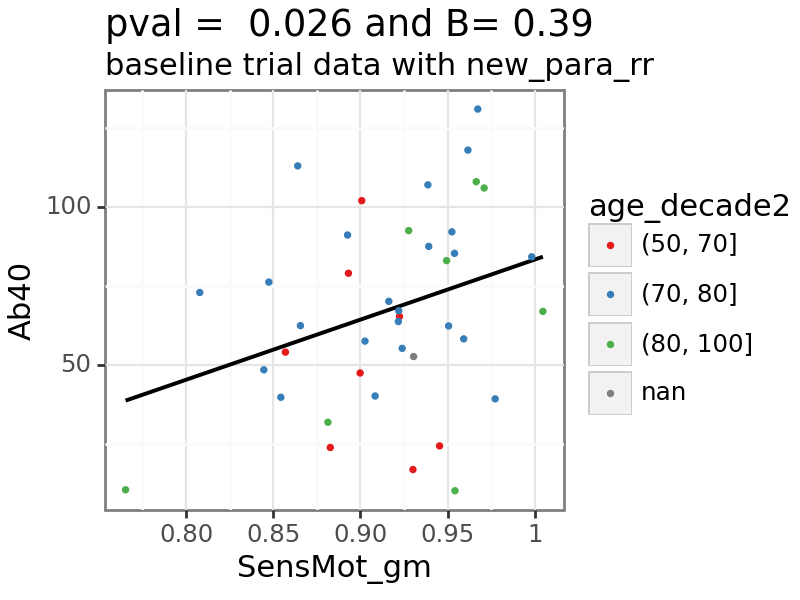

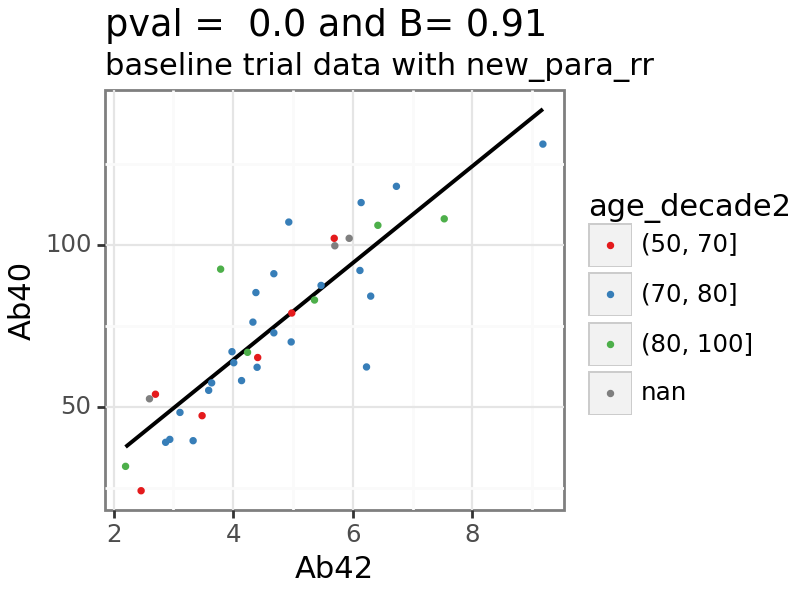

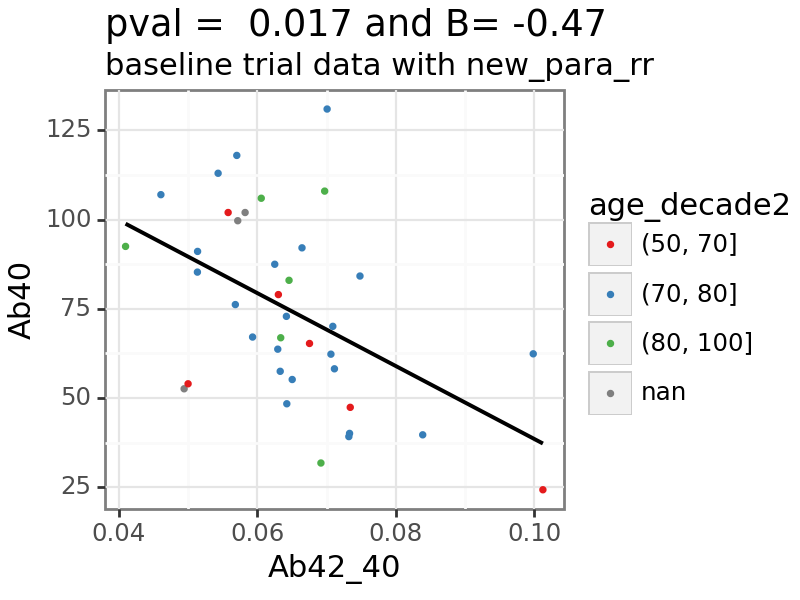

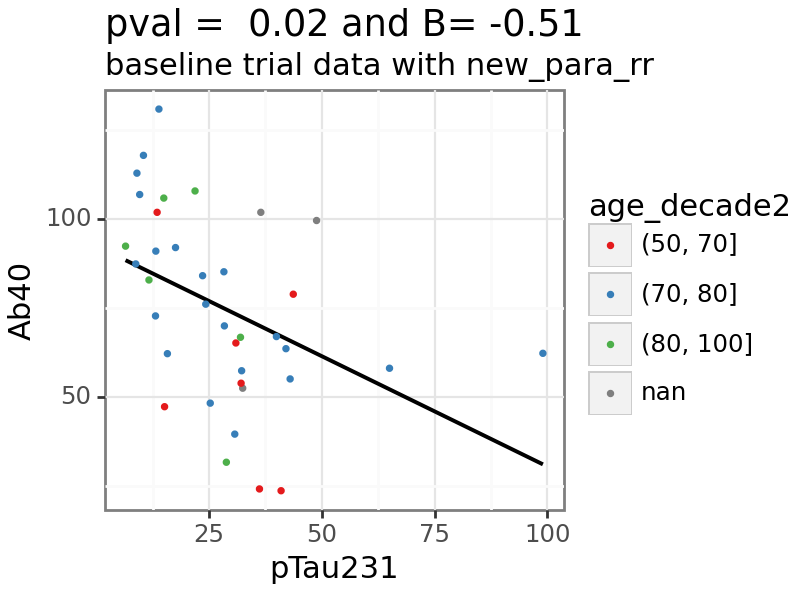

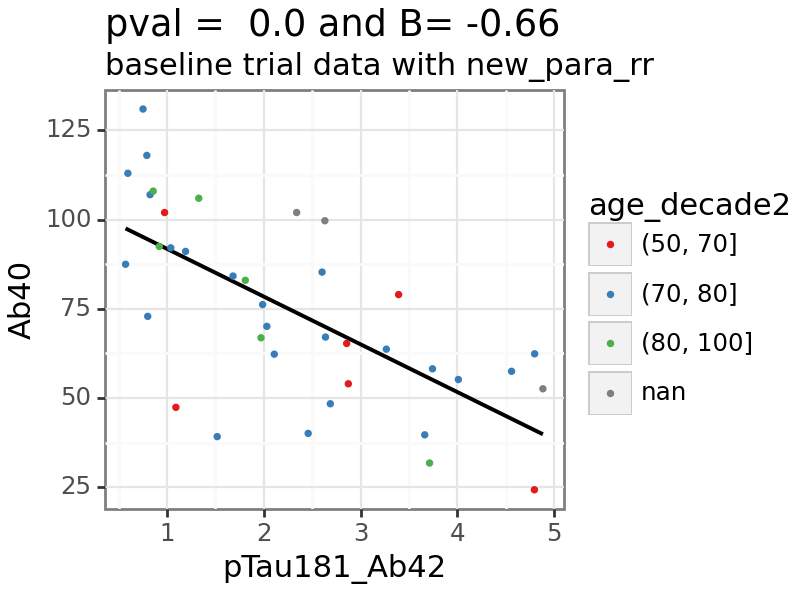

In [37]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42

In [38]:
x_var = 'Ab42'

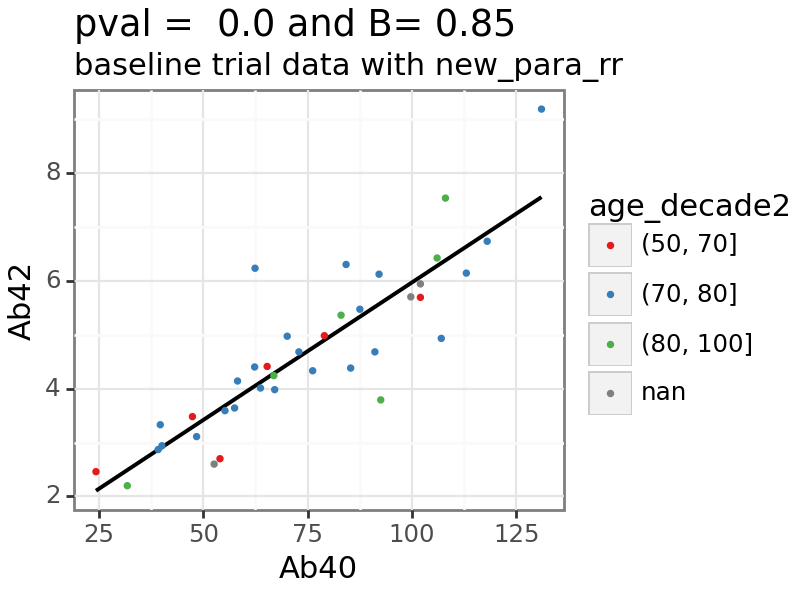

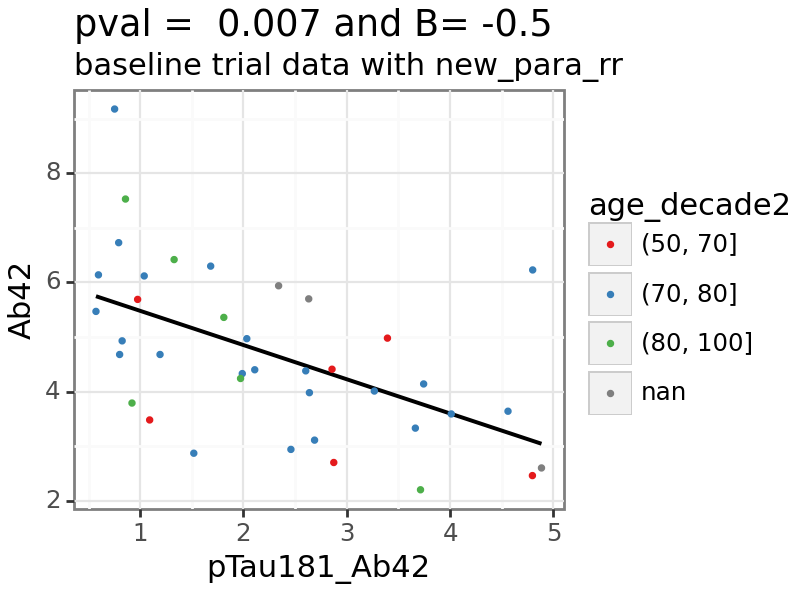

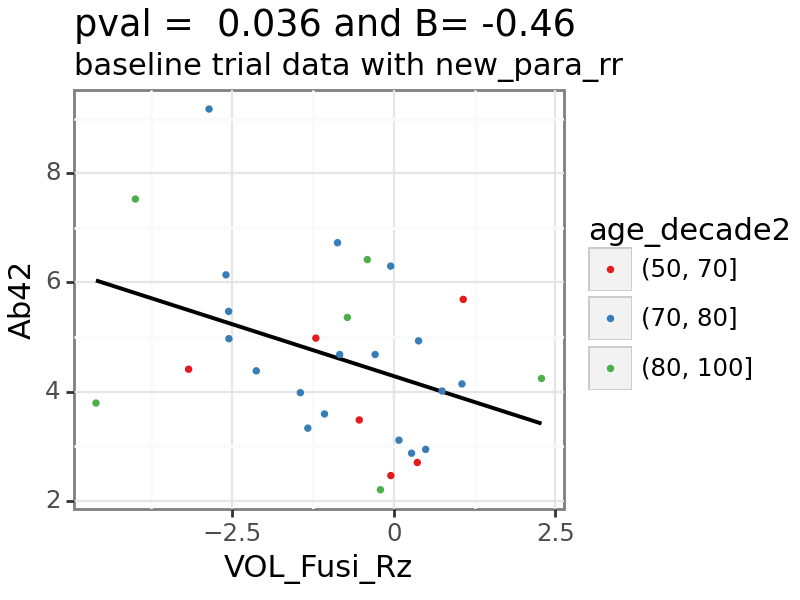

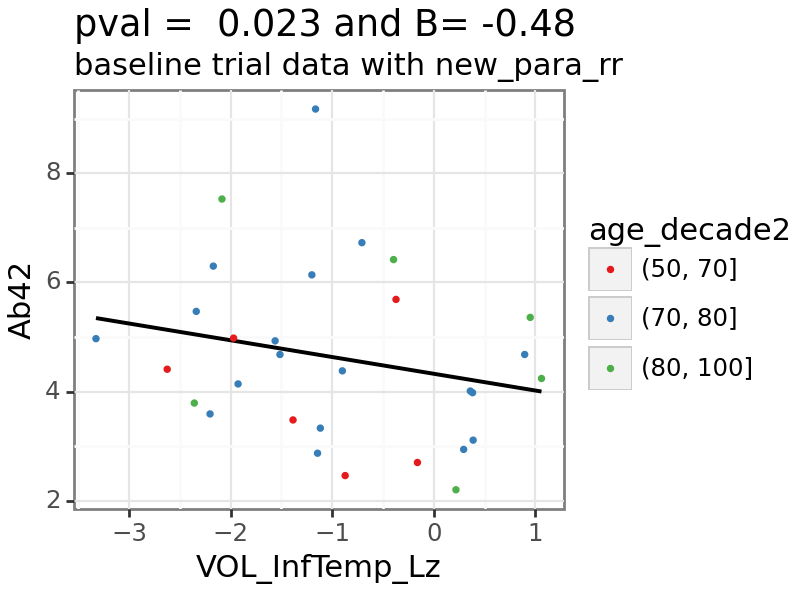

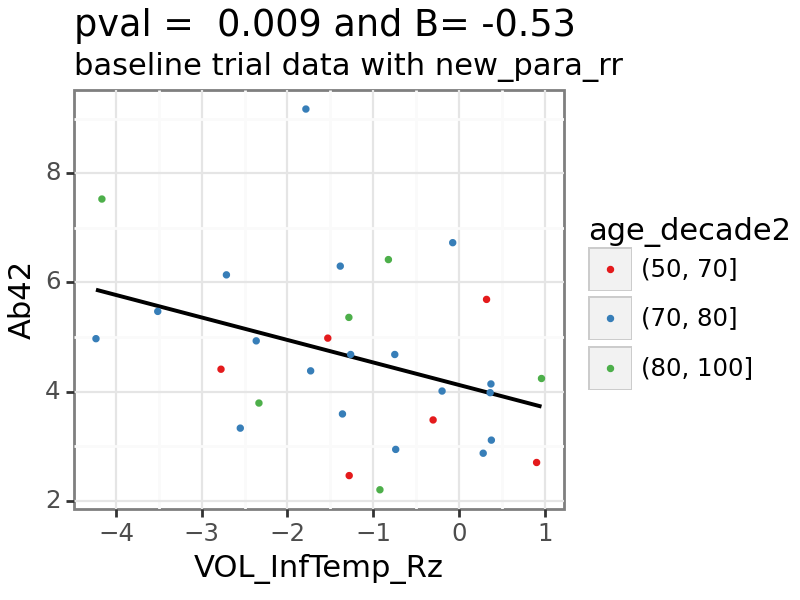

...

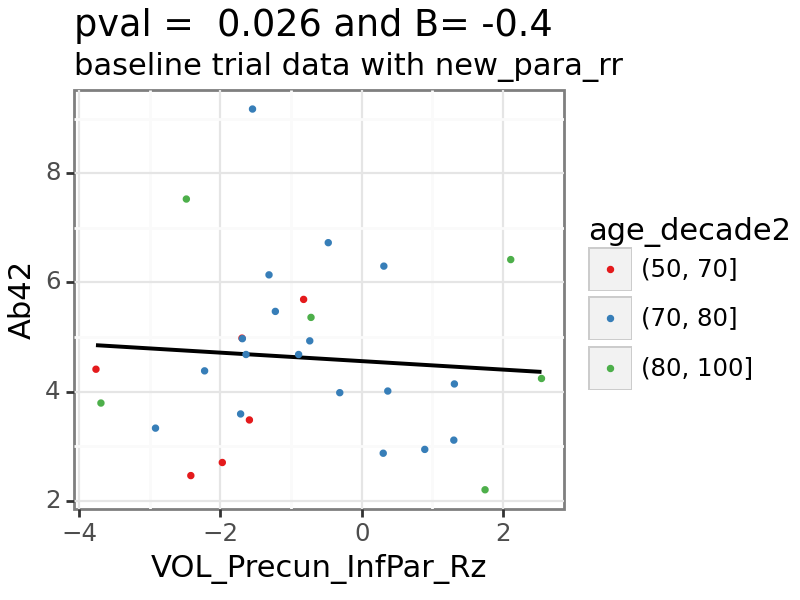

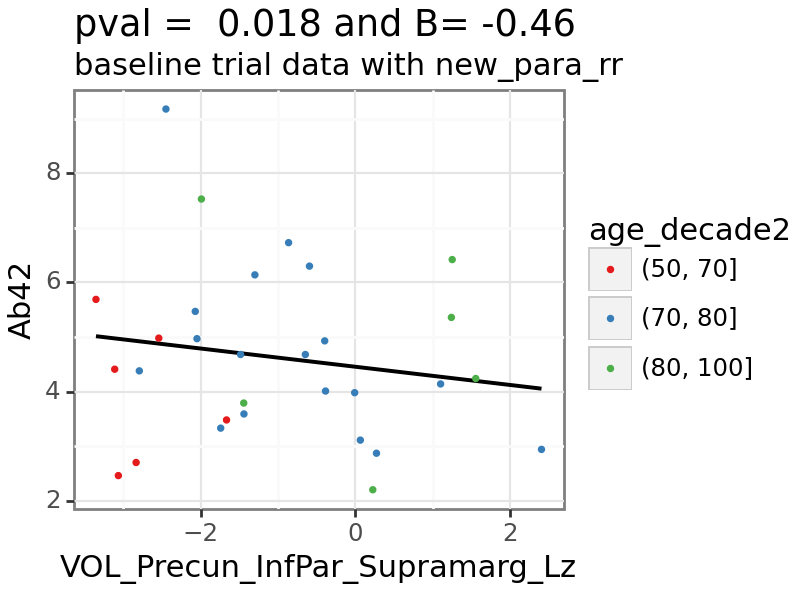

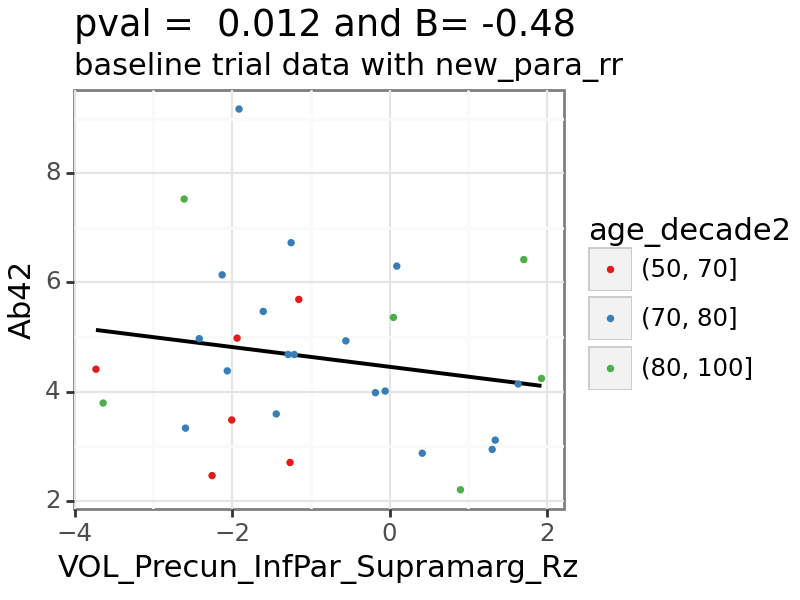

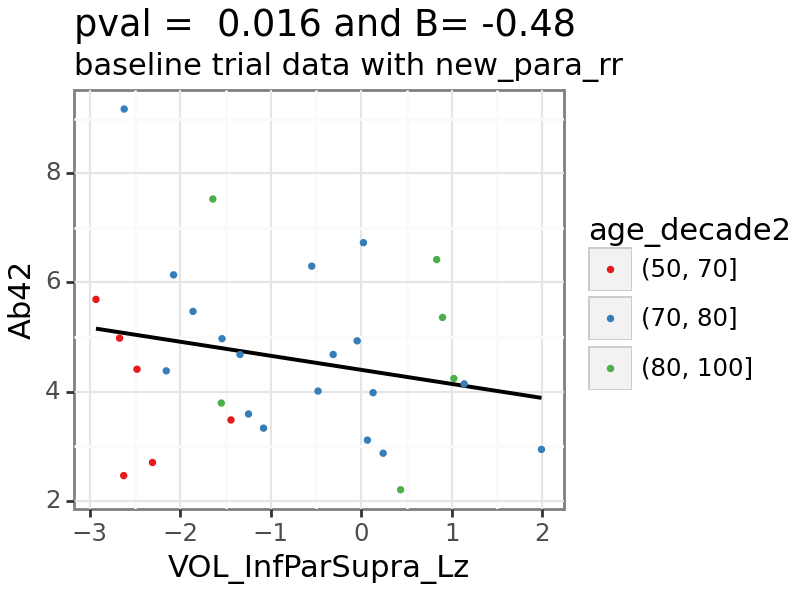

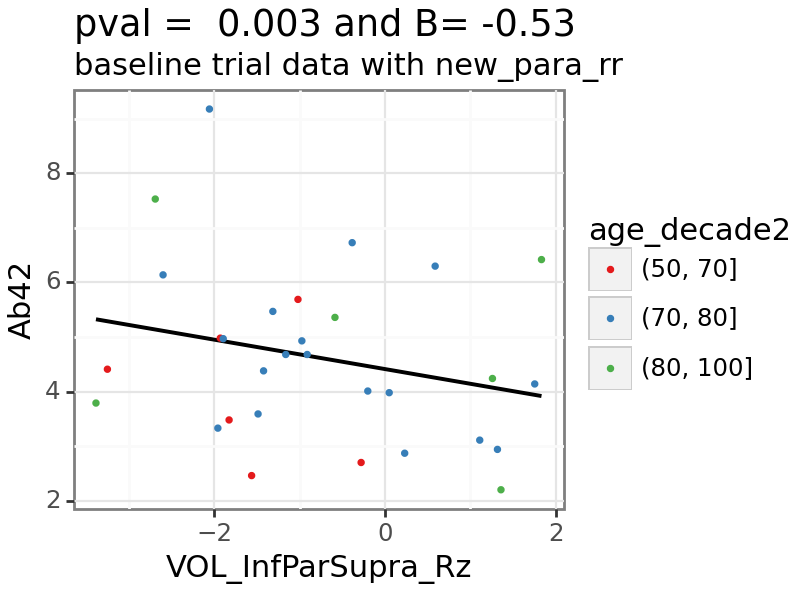

In [39]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42_40

In [40]:
x_var = 'Ab42_40'

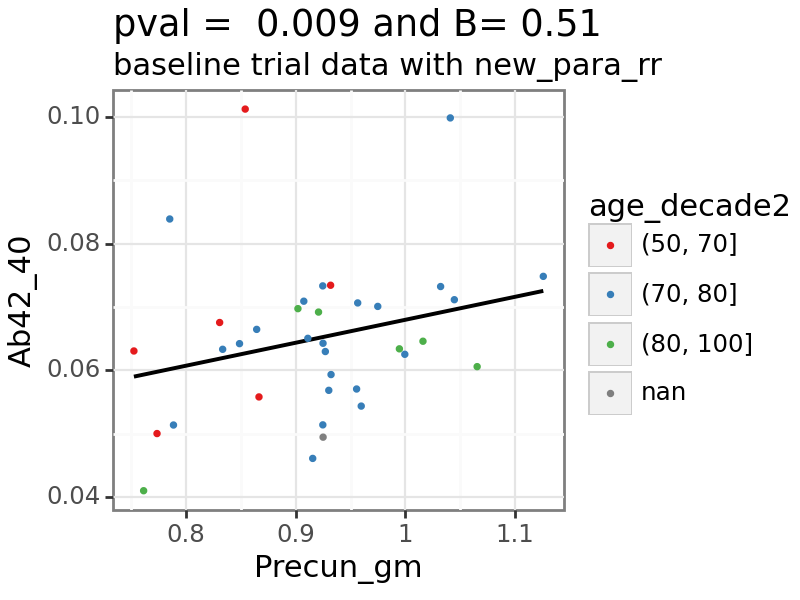

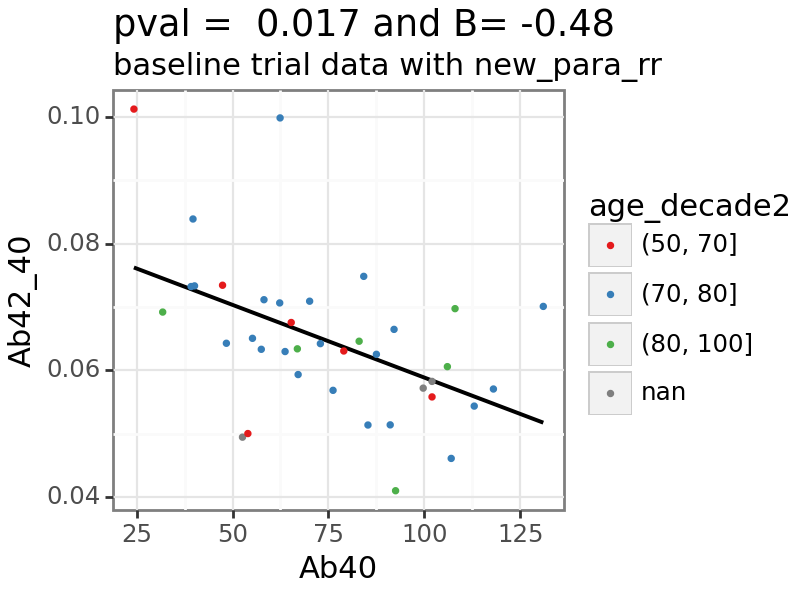

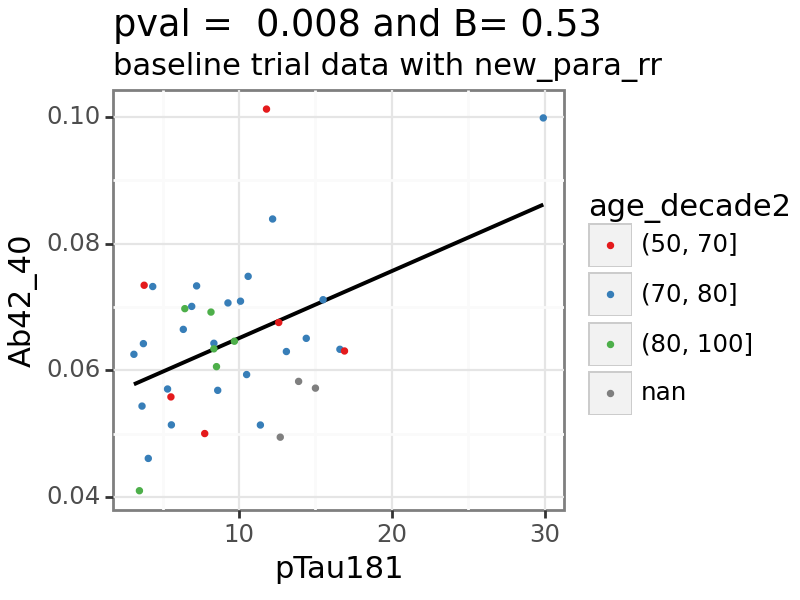

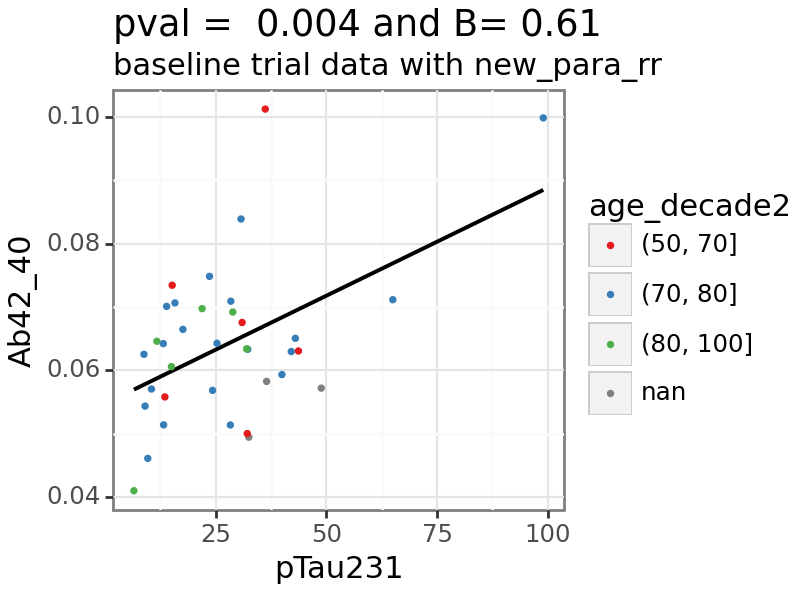

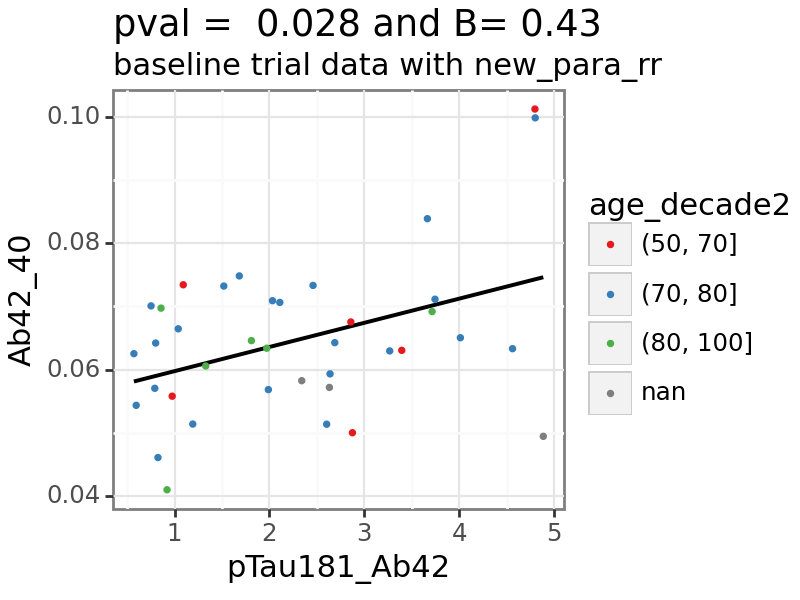

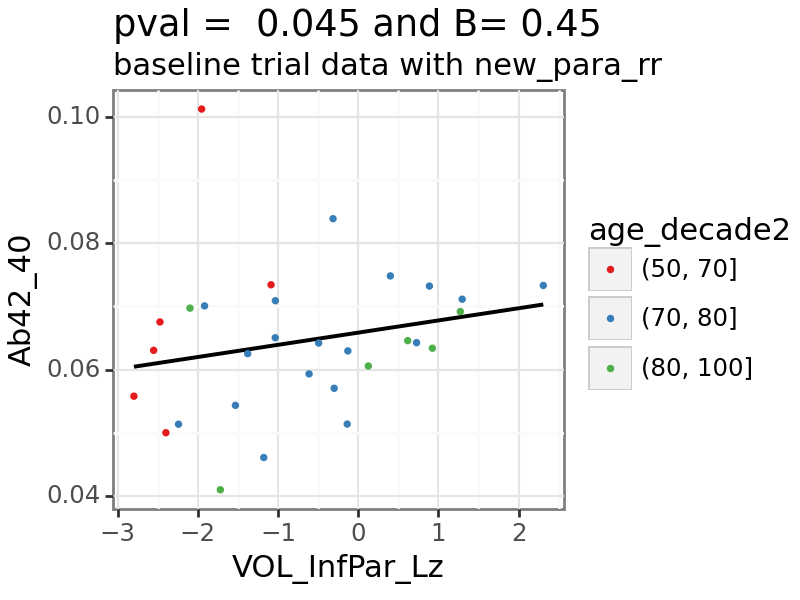

In [41]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181


In [42]:
x_var = 'pTau181'

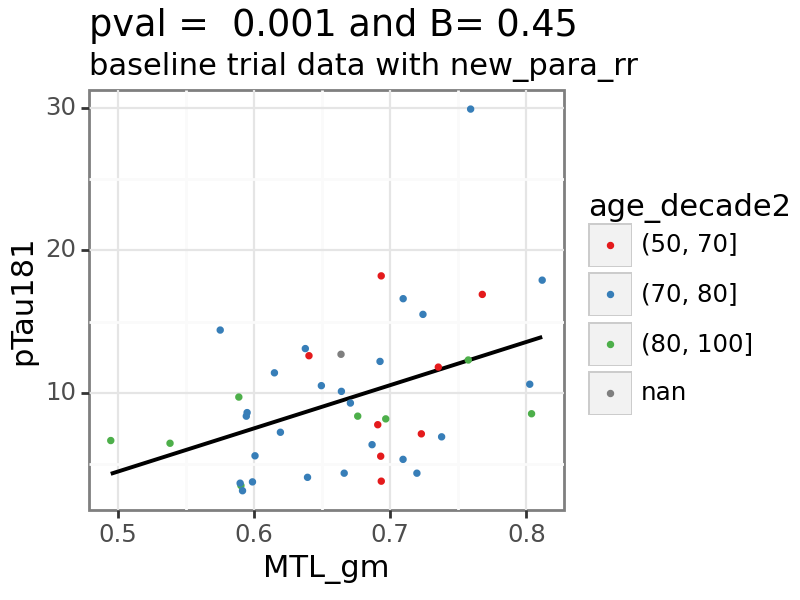

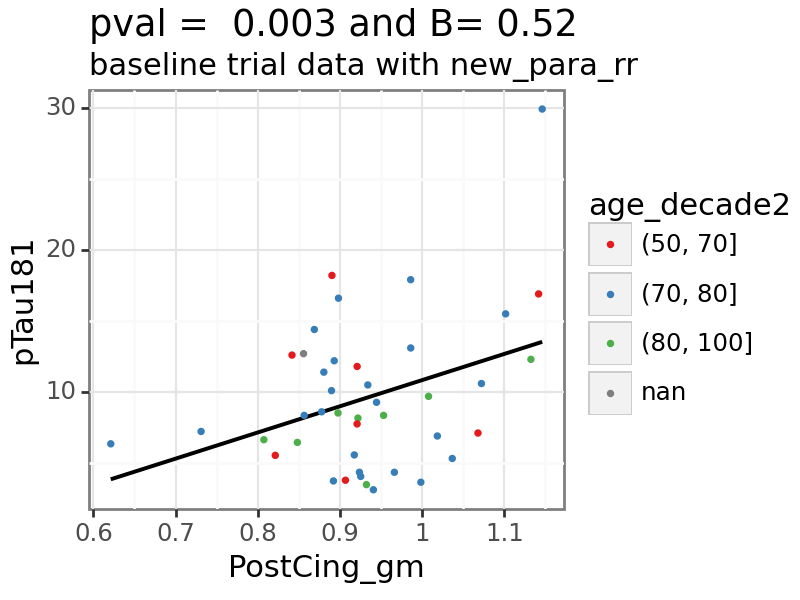

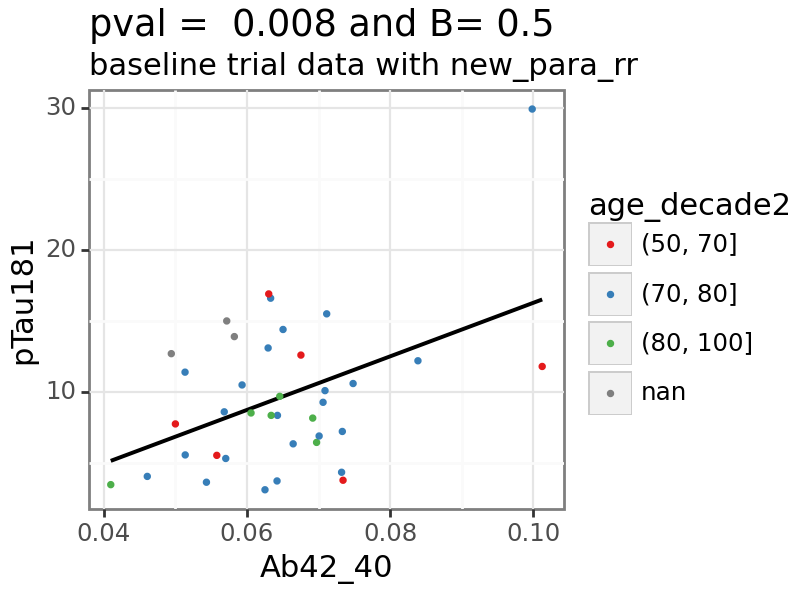

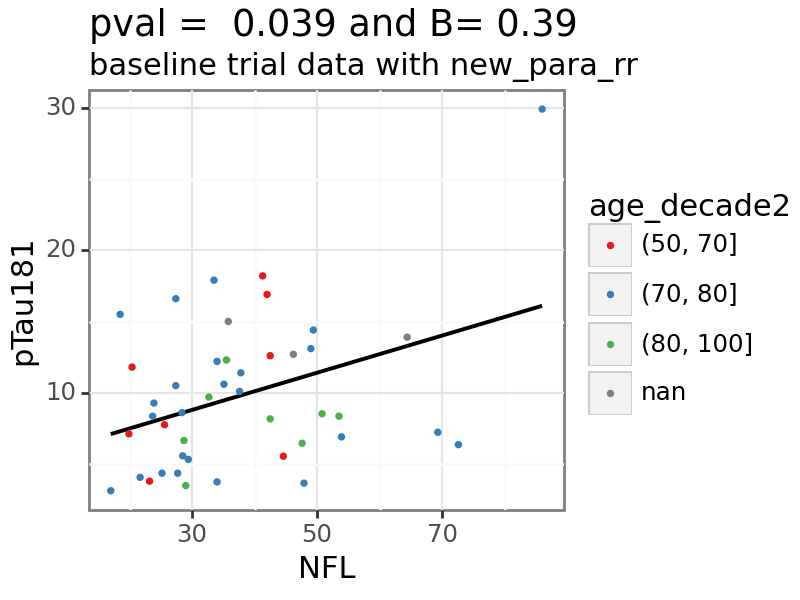

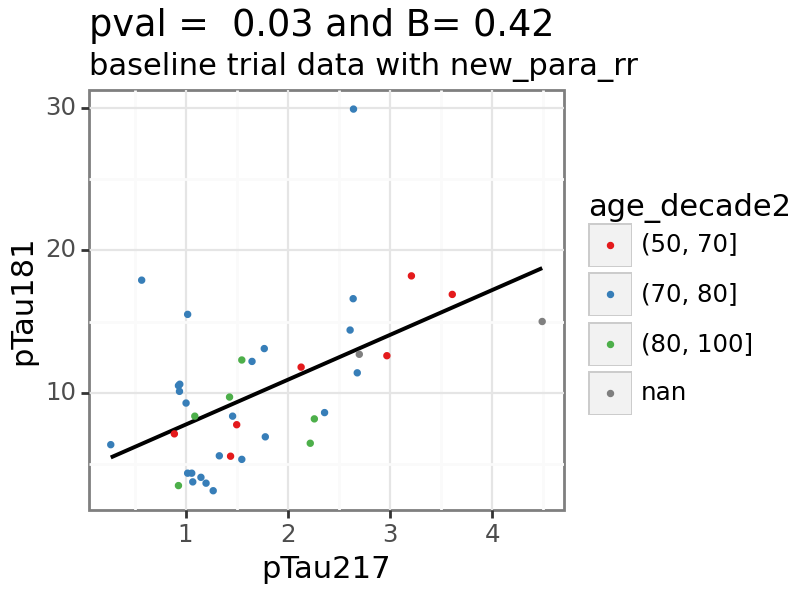

...

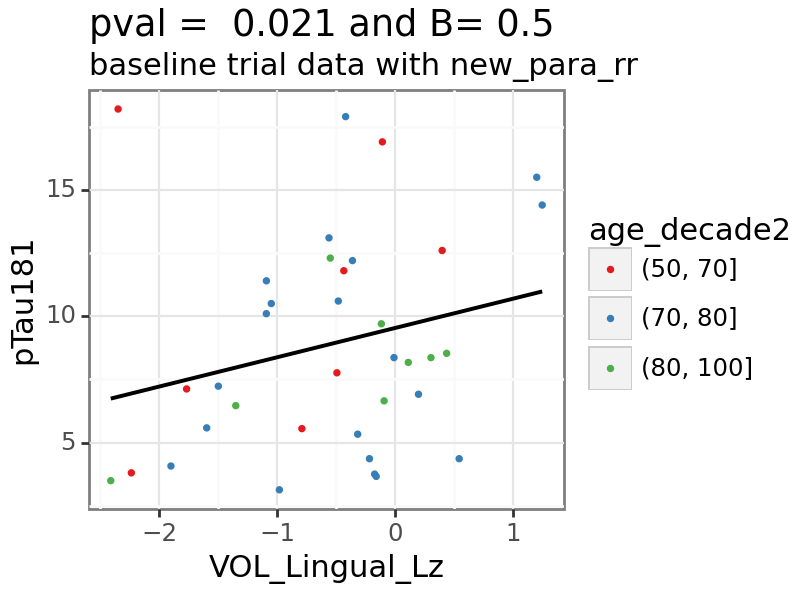

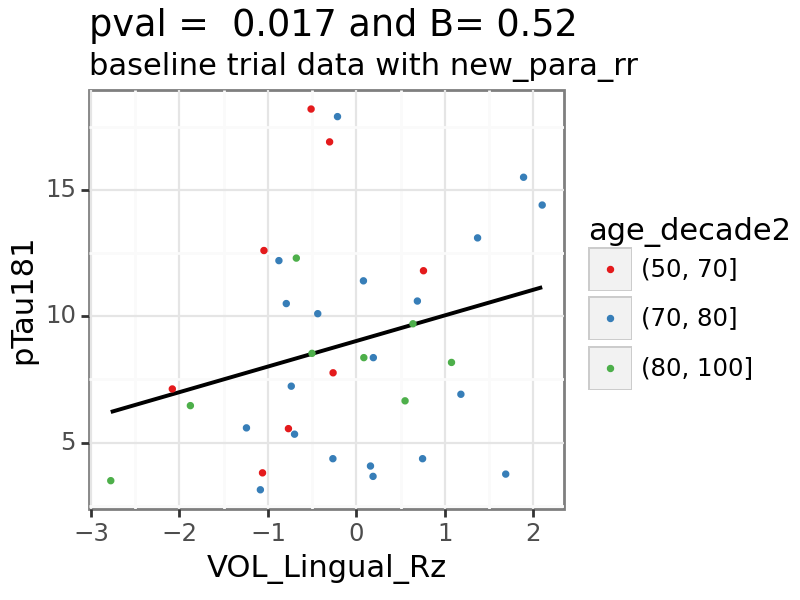

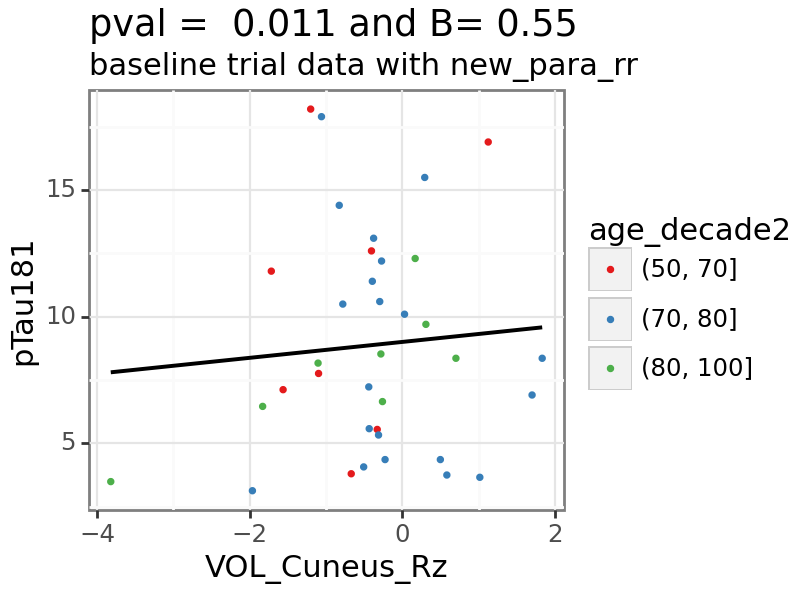

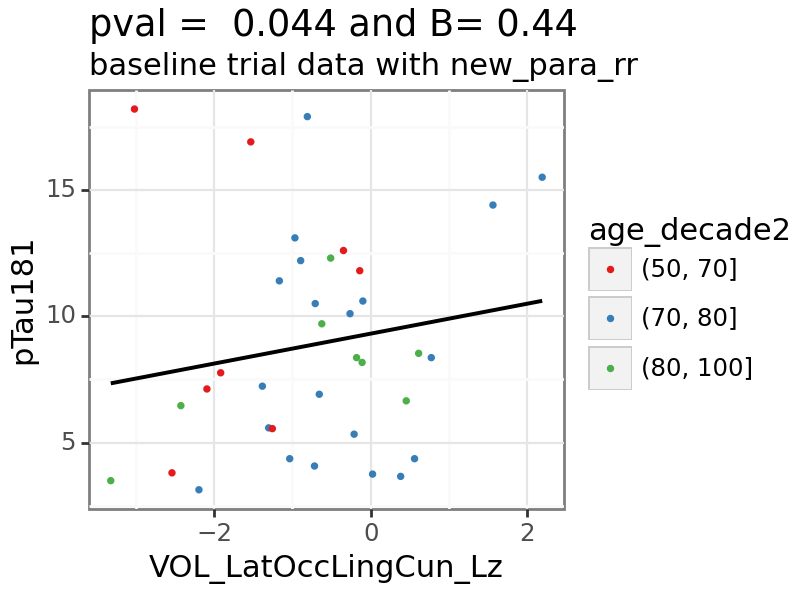

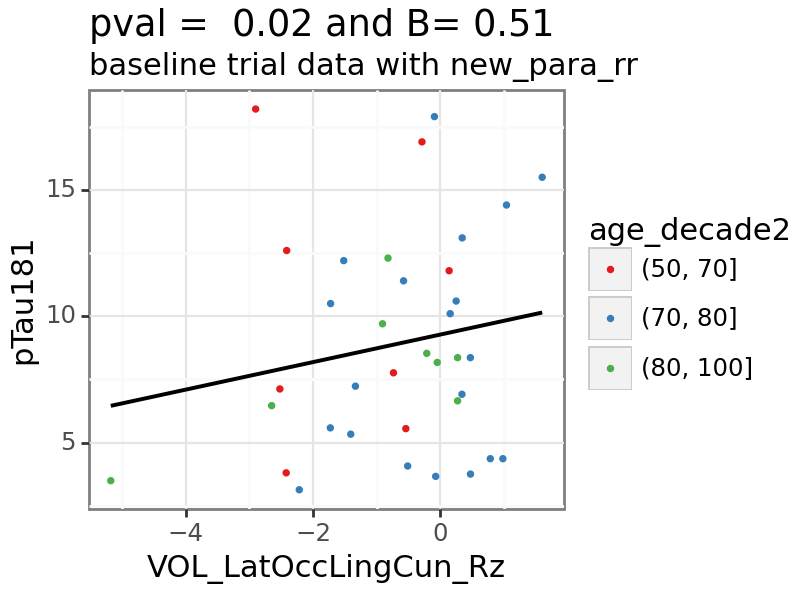

In [43]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

In [44]:
x_var = 'pTau217'

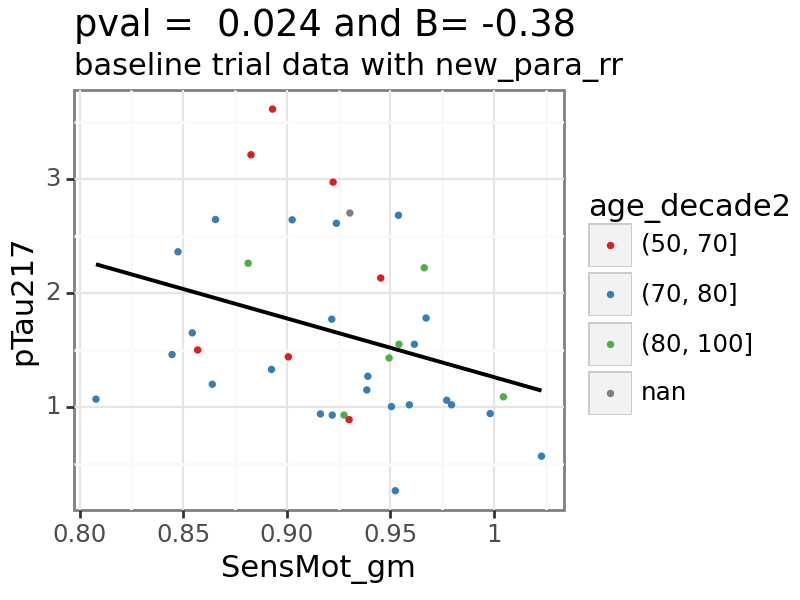

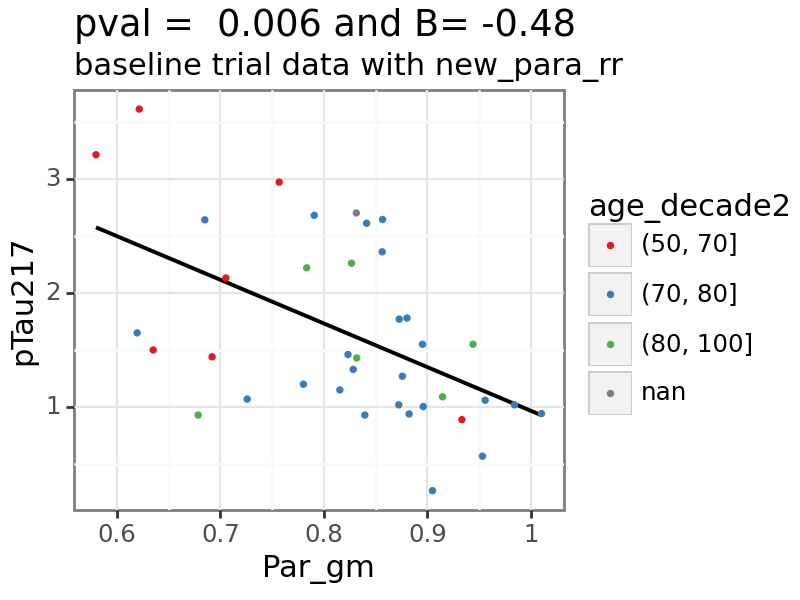

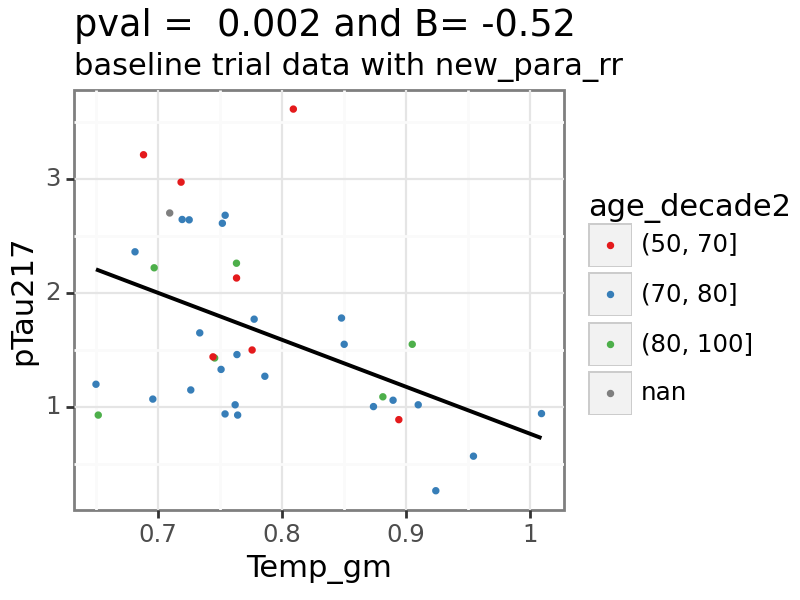

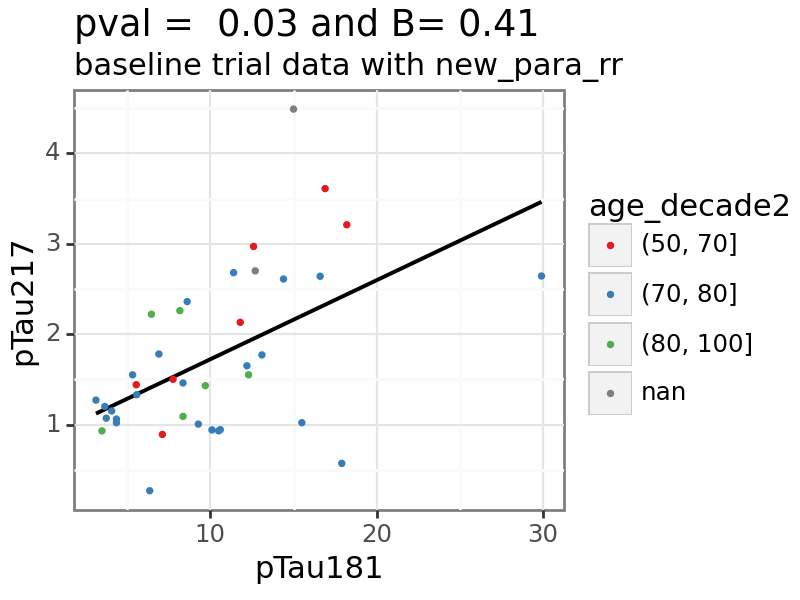

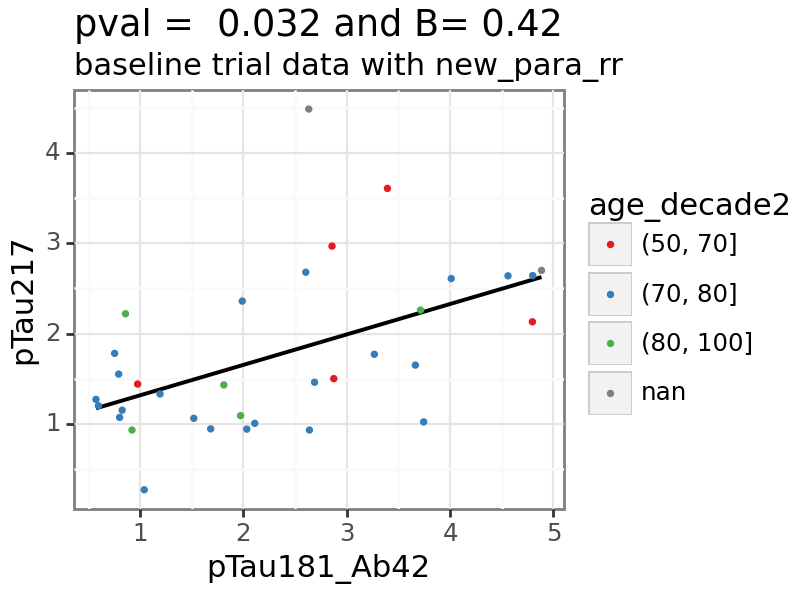

...

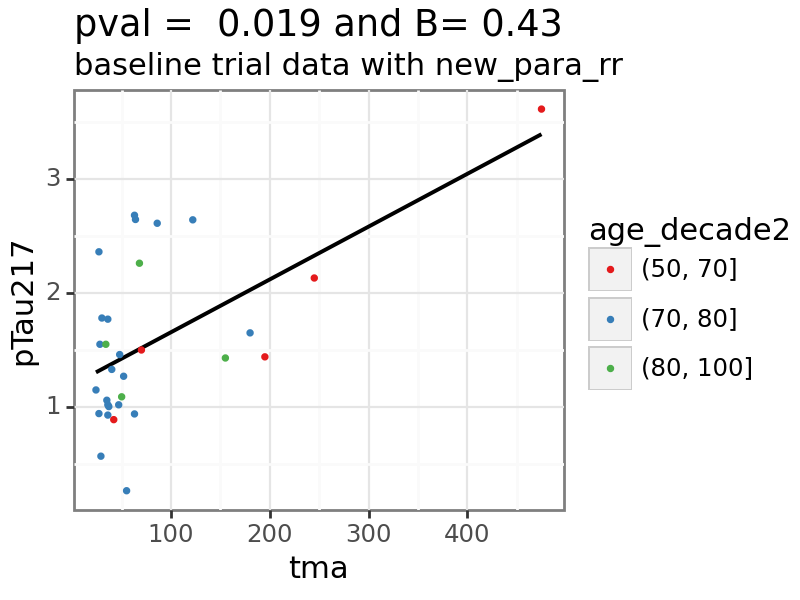

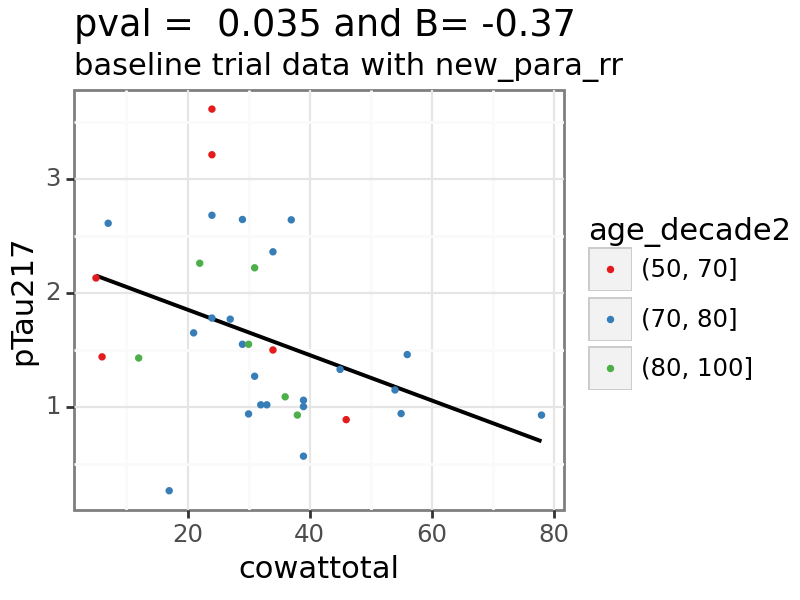

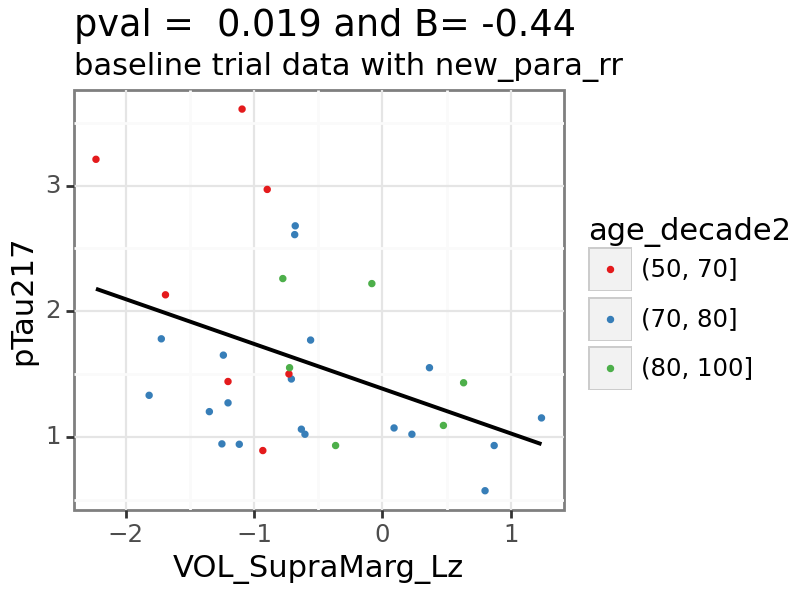

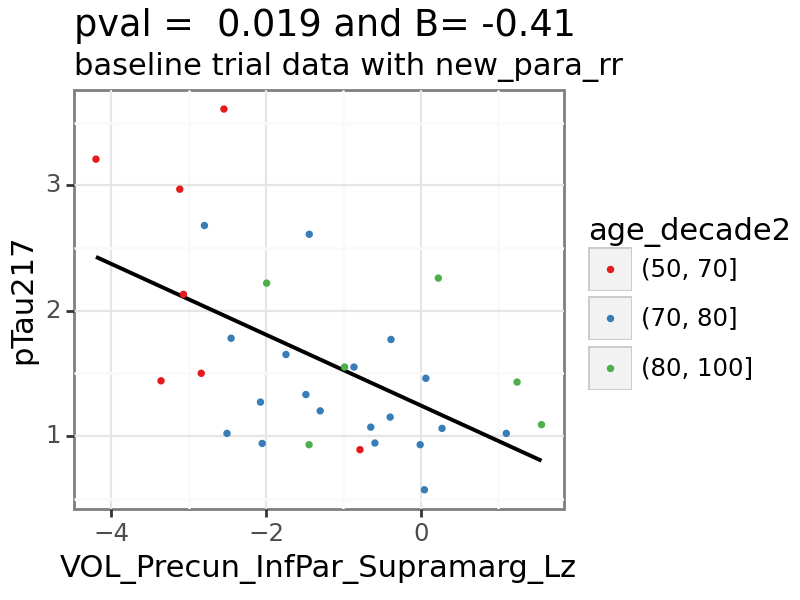

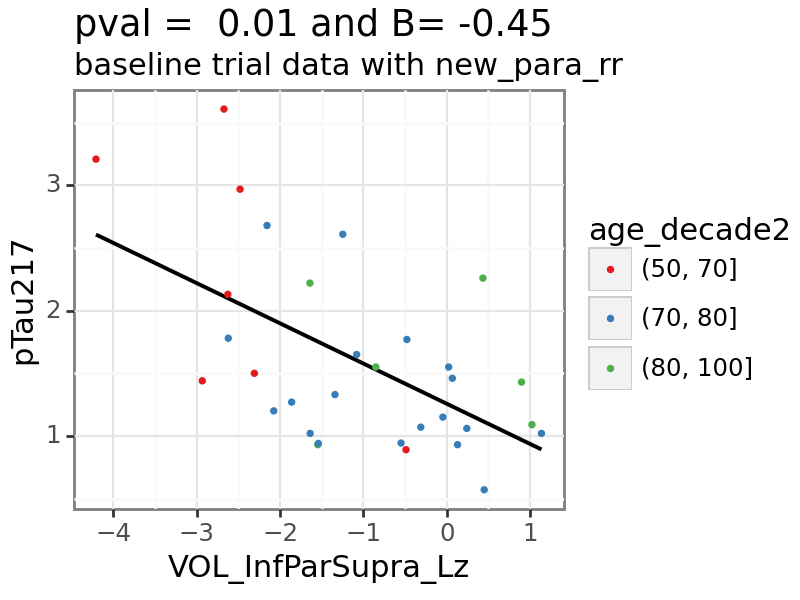

In [45]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']
    
for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau231

In [46]:
x_var = 'pTau231'

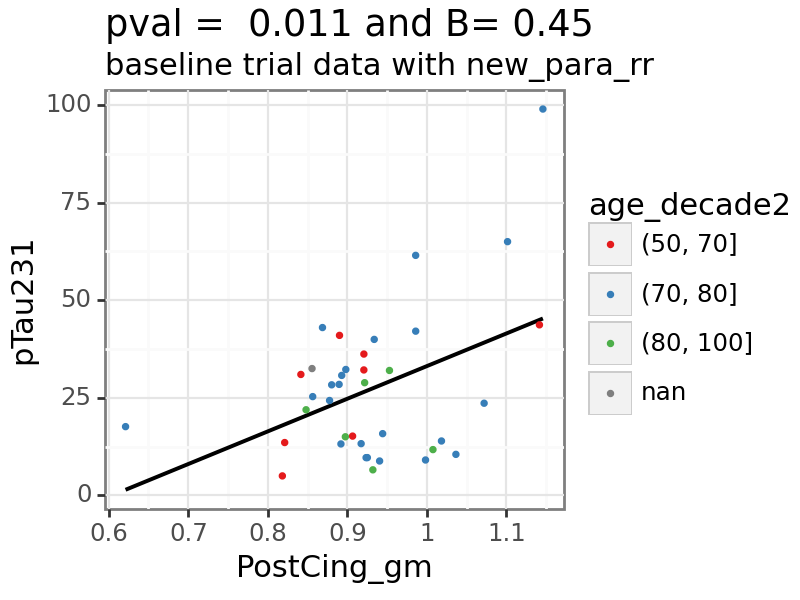

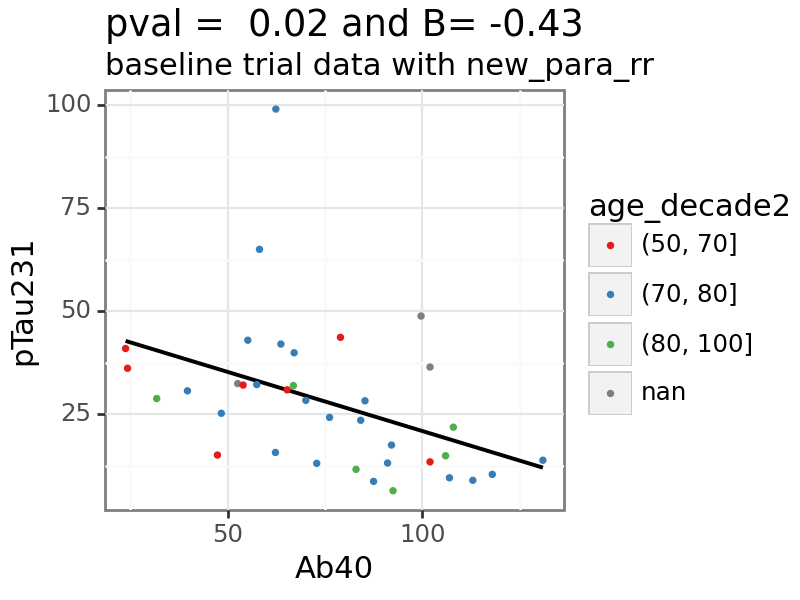

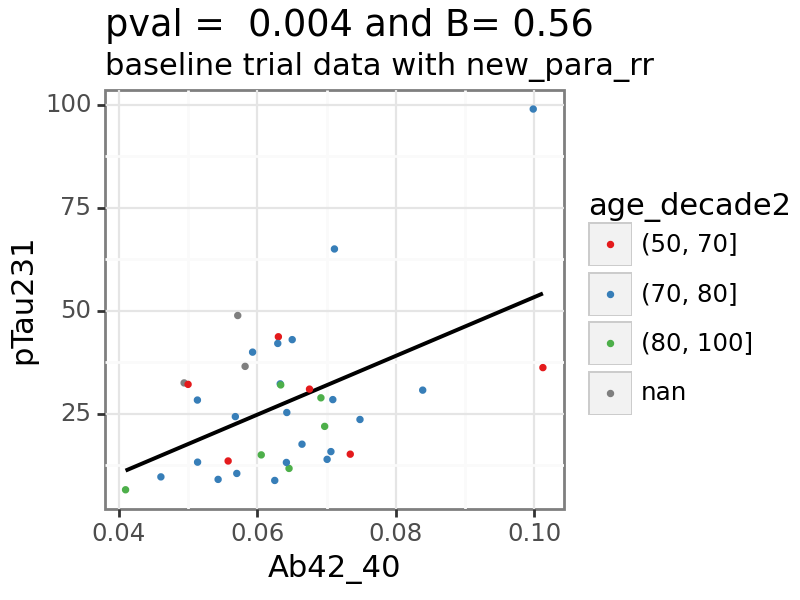

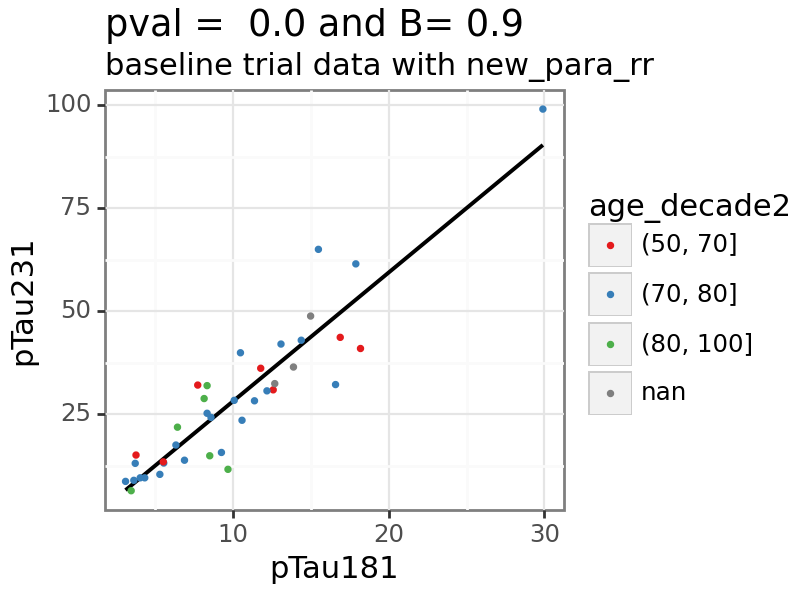

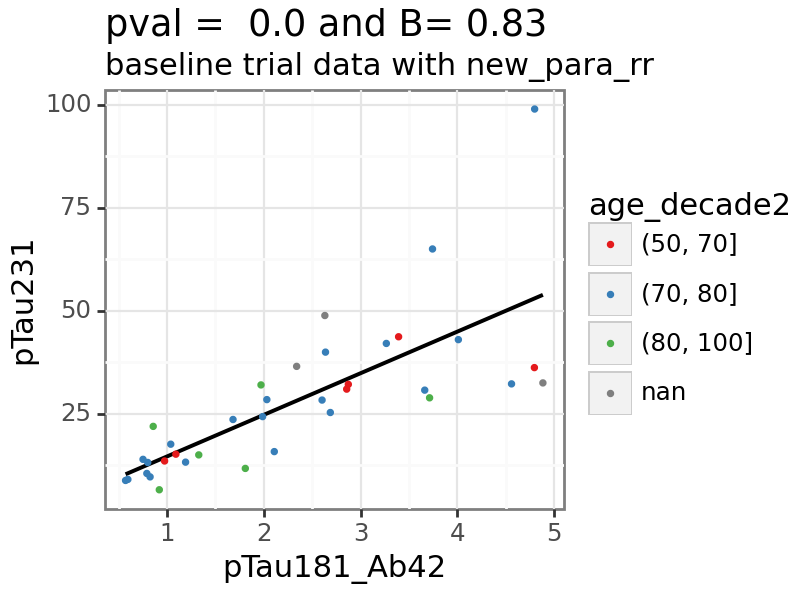

...

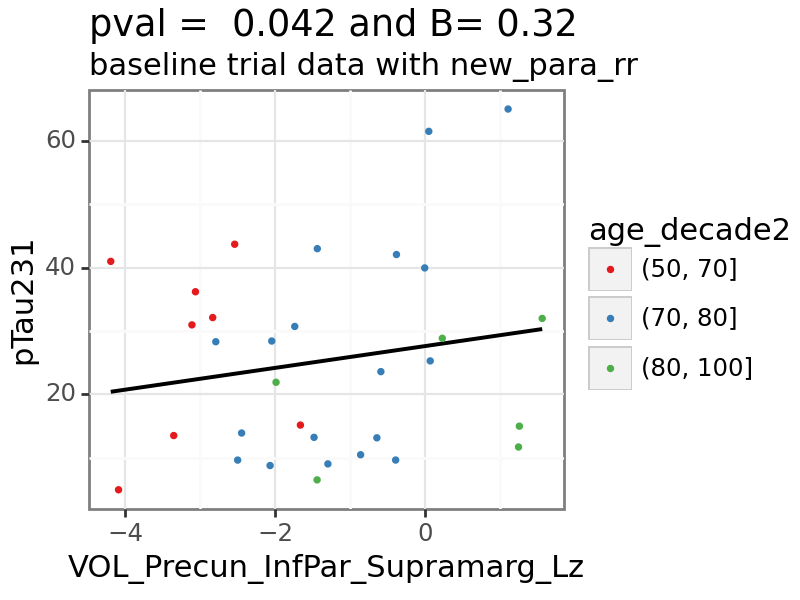

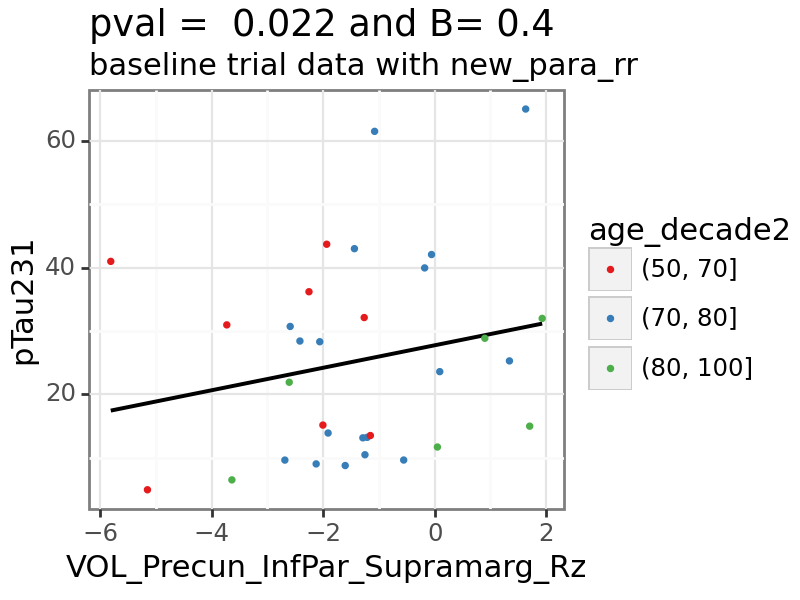

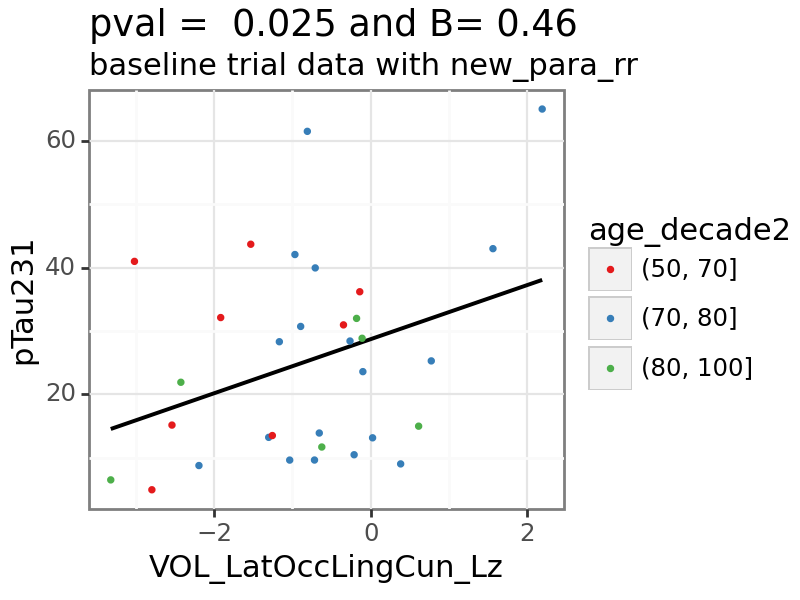

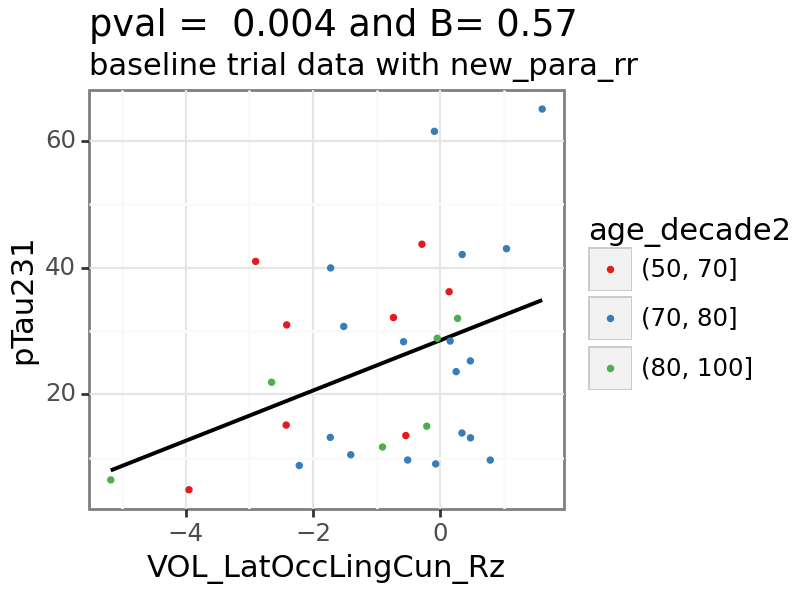

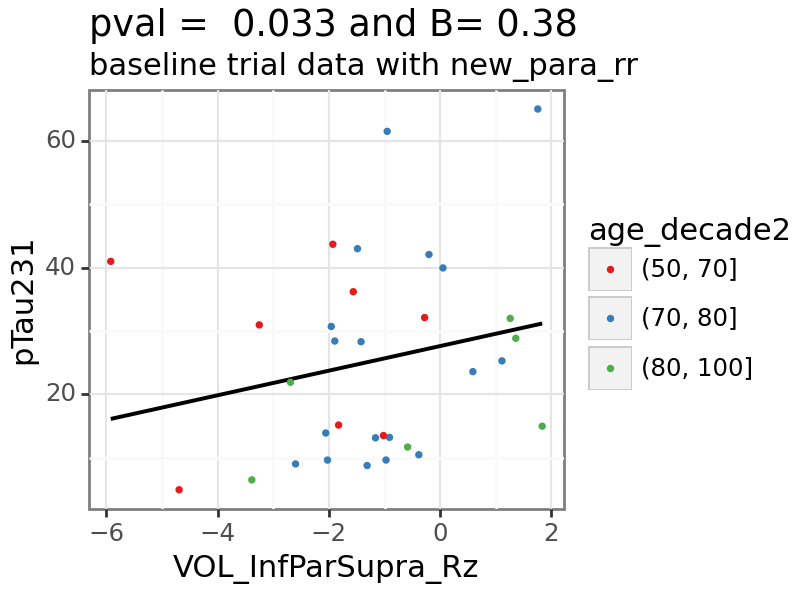

In [47]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

In [48]:
x_var = 'GFAP'

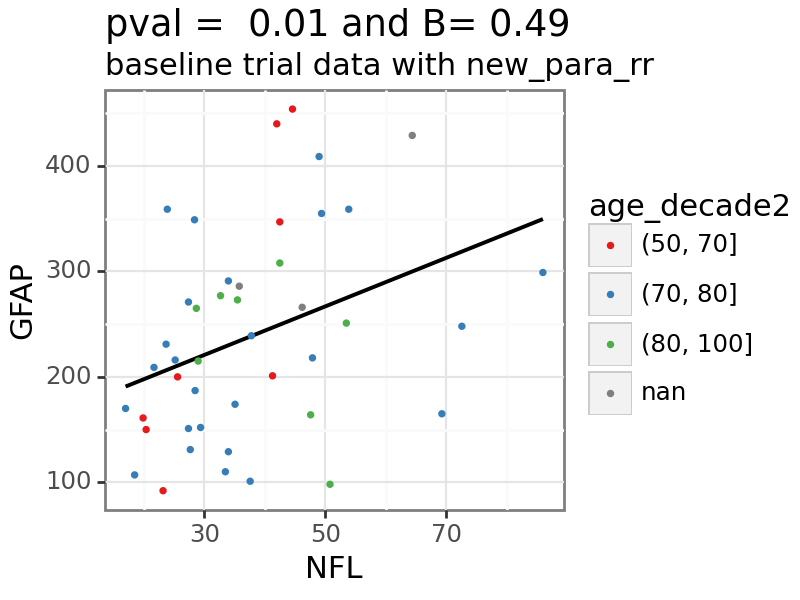

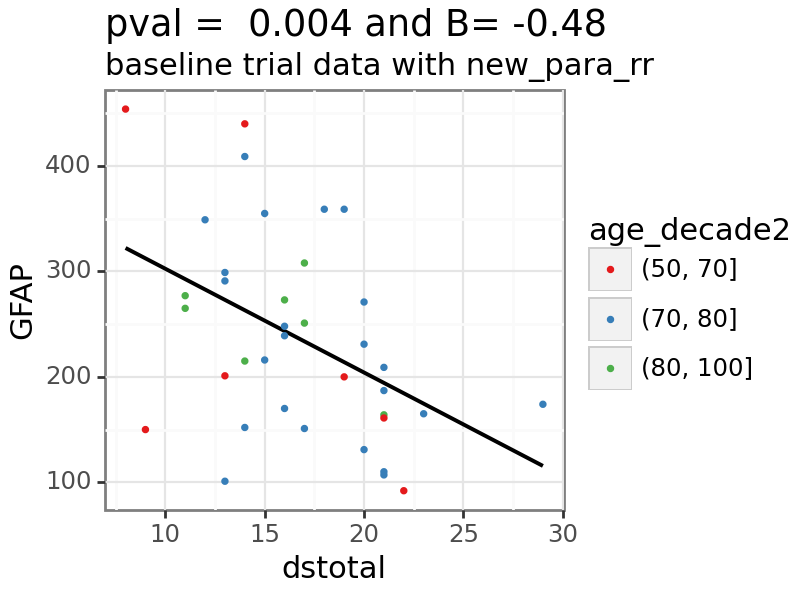

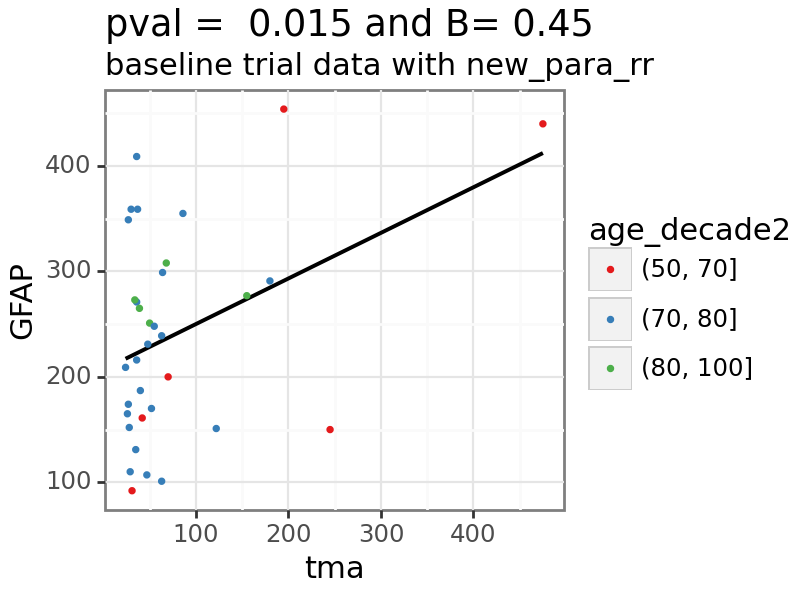

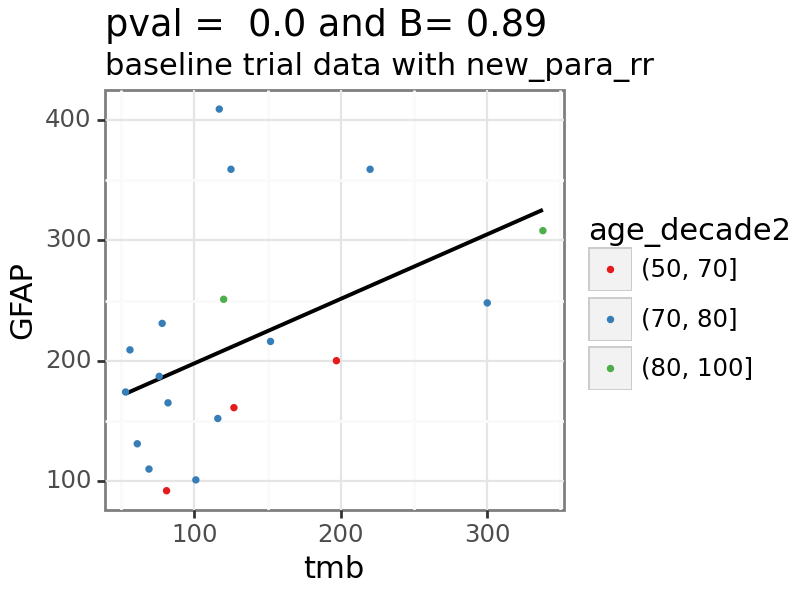

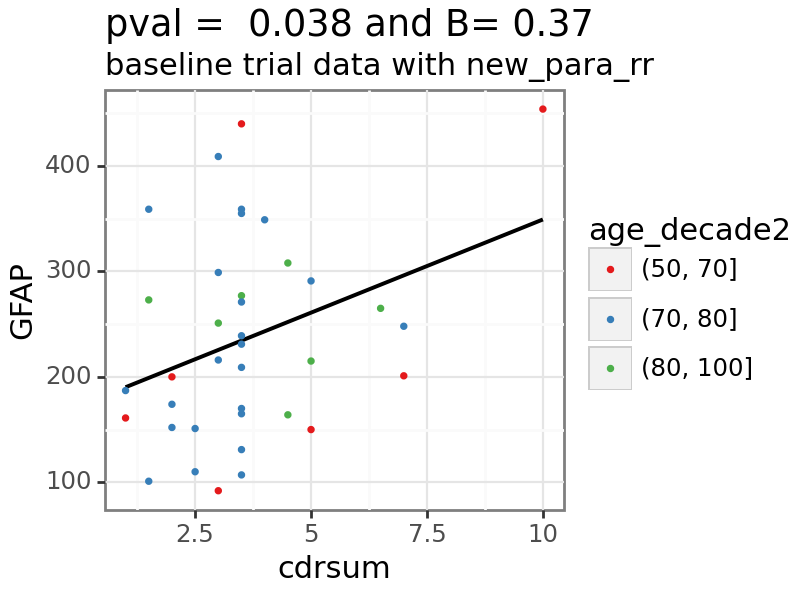

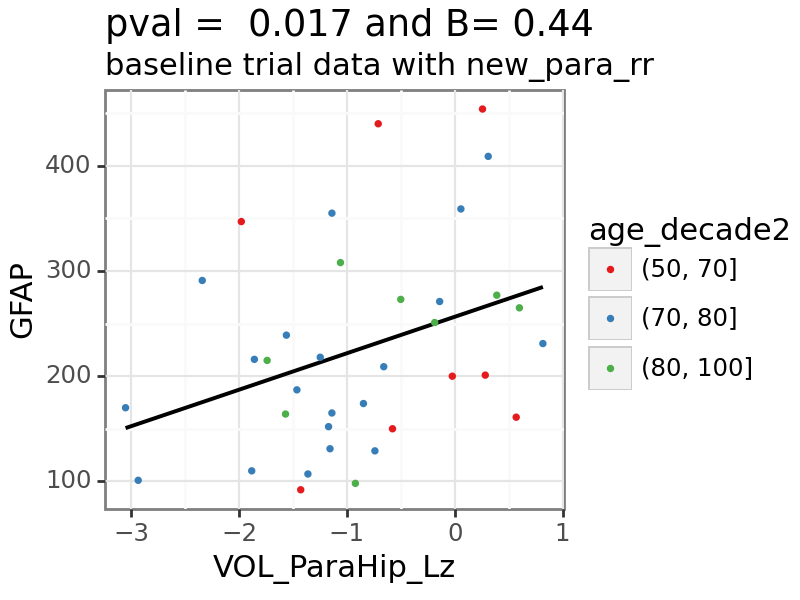

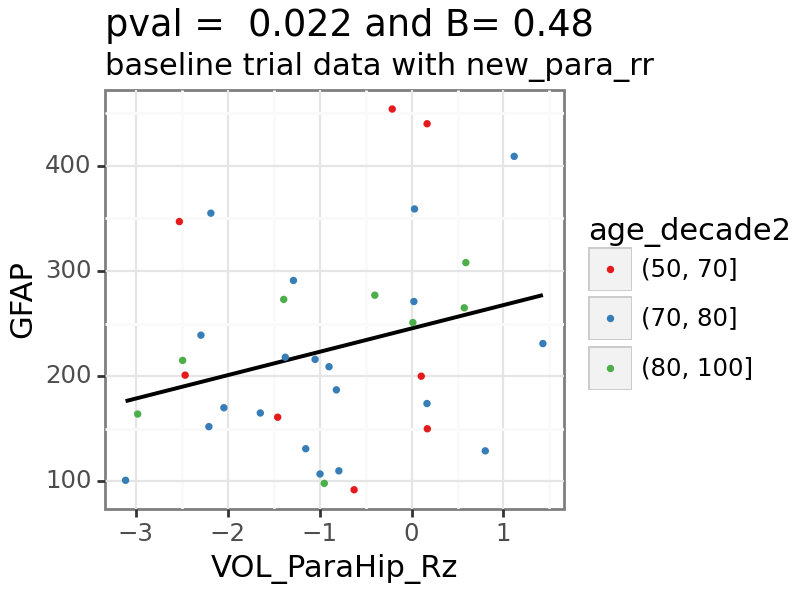

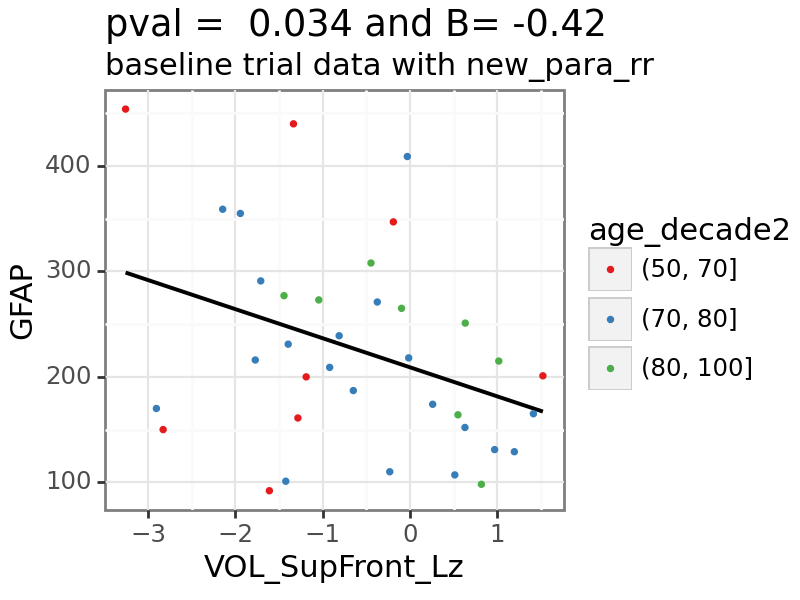

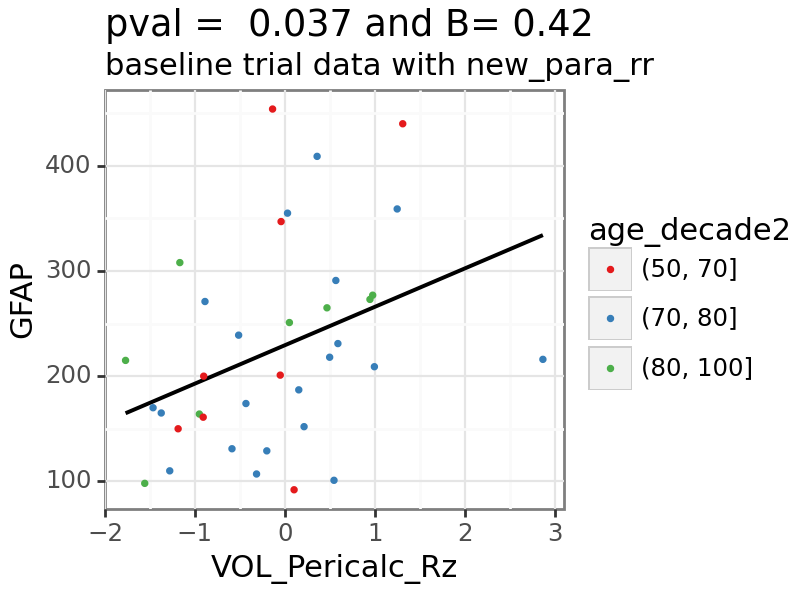

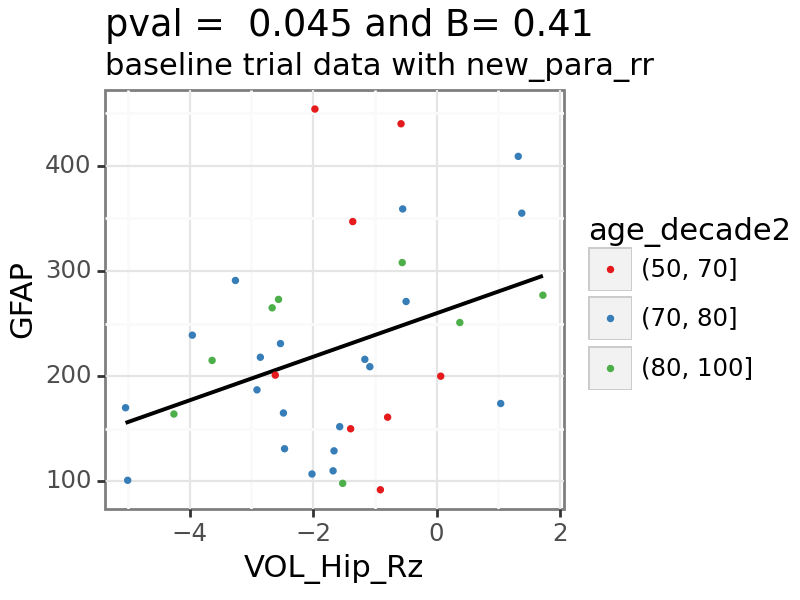

In [49]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

In [50]:
x_var = 'NFL'

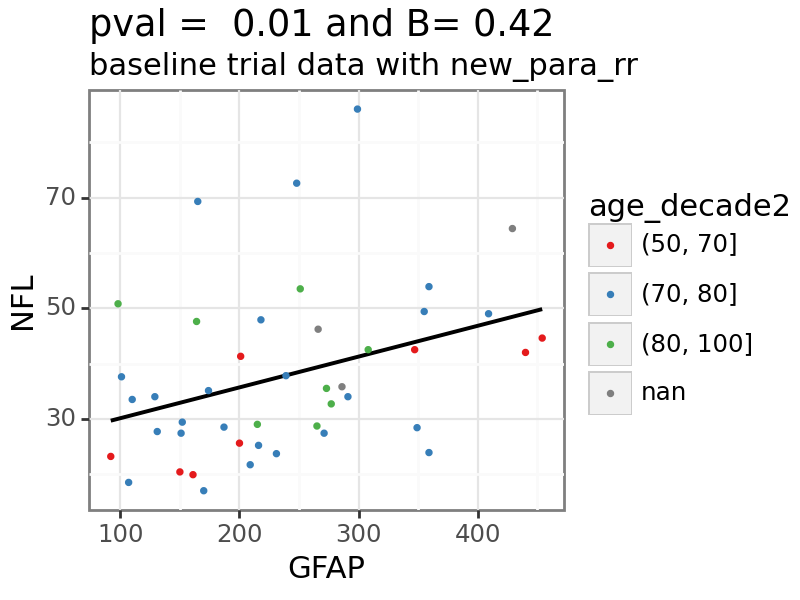

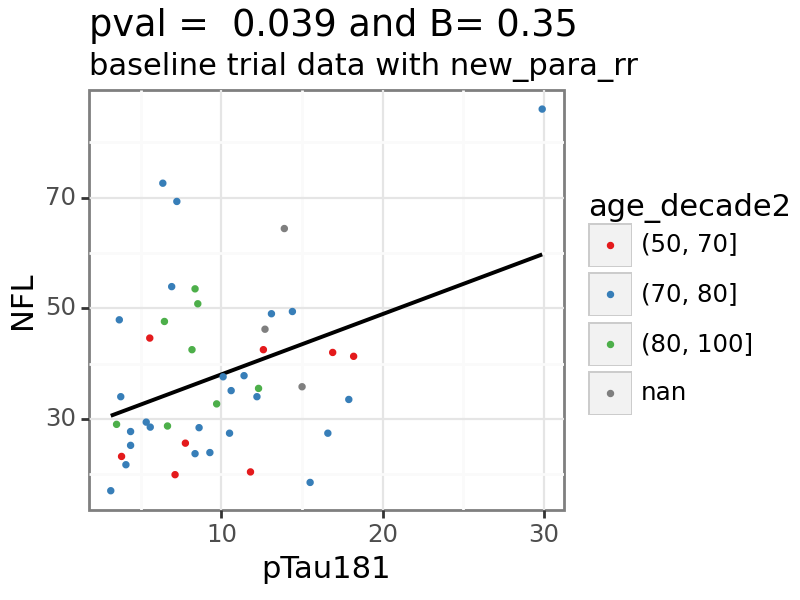

In [51]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']
    
for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181_Ab42_40

In [52]:
x_var = 'pTau181_Ab42_40'

In [53]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']


for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot reverse direction relationships split by other factors

In [54]:
baseline_trial_data['MMSE_bin'] = pd.qcut(baseline_trial_data['MMSE'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['cdrsum_bin'] = pd.qcut(baseline_trial_data['cdrsum'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['Ab42_40_log10_bin'] = pd.qcut(baseline_trial_data['Ab42_40_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['pTau217_log10_bin'] = pd.qcut(baseline_trial_data['pTau217_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['GFAP_log10_bin'] = pd.qcut(baseline_trial_data['GFAP_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['NFL_log10_bin'] = pd.qcut(baseline_trial_data['NFL_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['VOL_Hip_Rz_bin'] = pd.qcut(baseline_trial_data['VOL_Hip_Rz'], [0, .33, .66, 1.], precision = 2).astype('str')

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\4187745018.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\4187745018.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\4187745018.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://p

## Age decade 2

In [55]:
biomarker_relationship_results_log10.loc[ biomarker_relationship_results_log10['x_var'].isin([x_var]), :]

,y_var,x_var,model_p_val_baseline,model_B_val_baseline,model_n_baseline,model_p_val_Intercept,model_p_val_apoe4_carrier[T.Yes],model_p_val_sex[T.M],model_p_val_race[T.White/NH],model_p_val_age,model_p_val_Education_years,model_p_val_x_var,model_B_val_Intercept,model_B_val_apoe4_carrier[T.Yes],model_B_val_sex[T.M],model_B_val_race[T.White/NH],model_B_val_age,model_B_val_Education_years,model_B_val_x_var,type


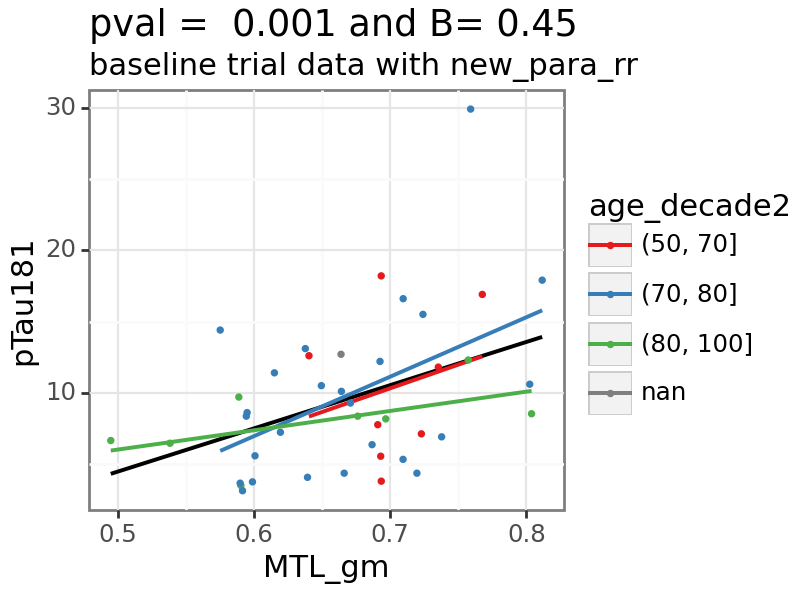

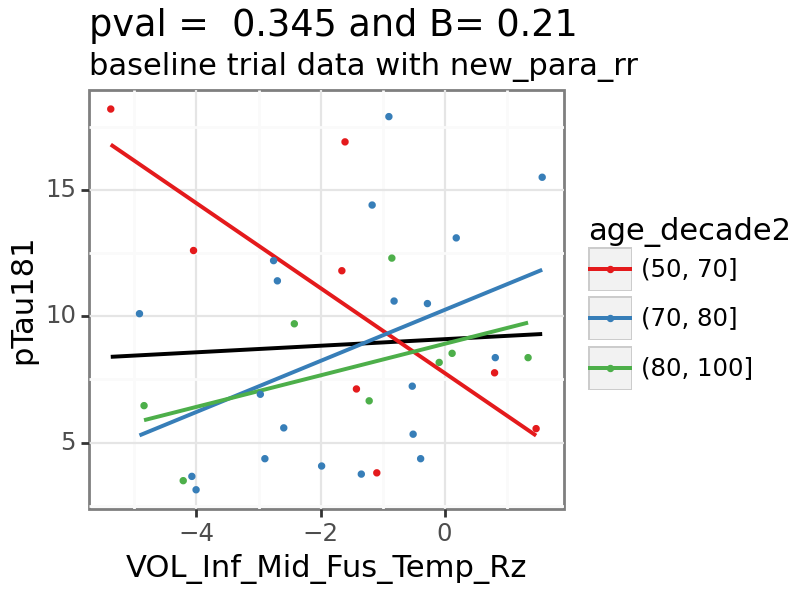

In [56]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR sum of boxes

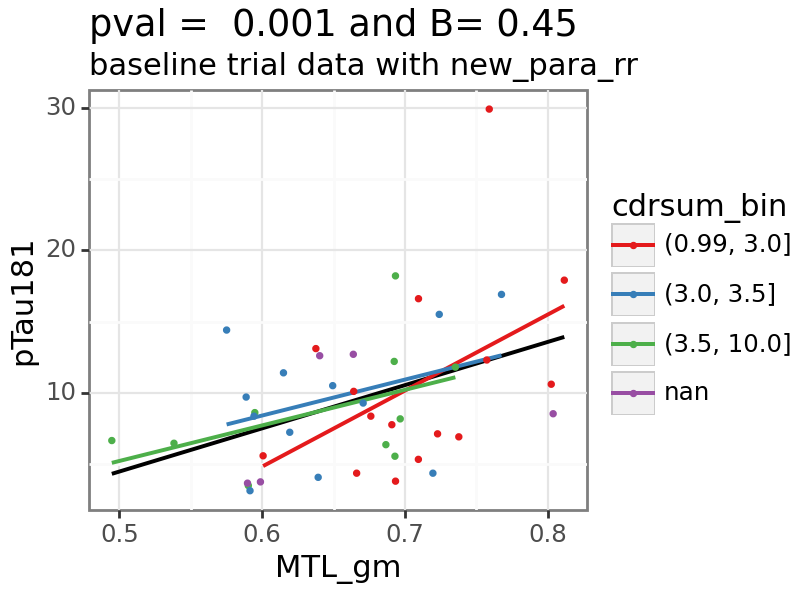

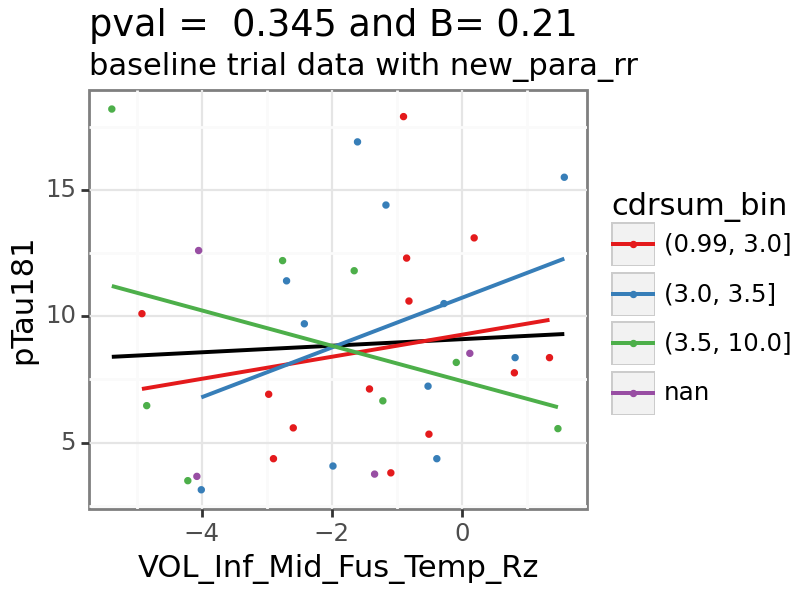

In [57]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in [ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrsum_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'cdrsum_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR 

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\2154266830.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


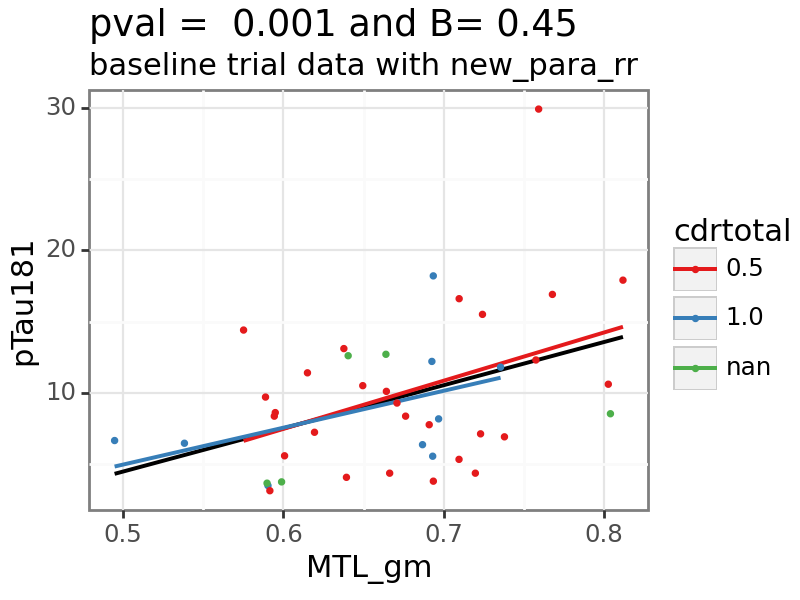

C:\Users\Lauren.Koenig\AppData\Local\Temp\6\ipykernel_7304\2154266830.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


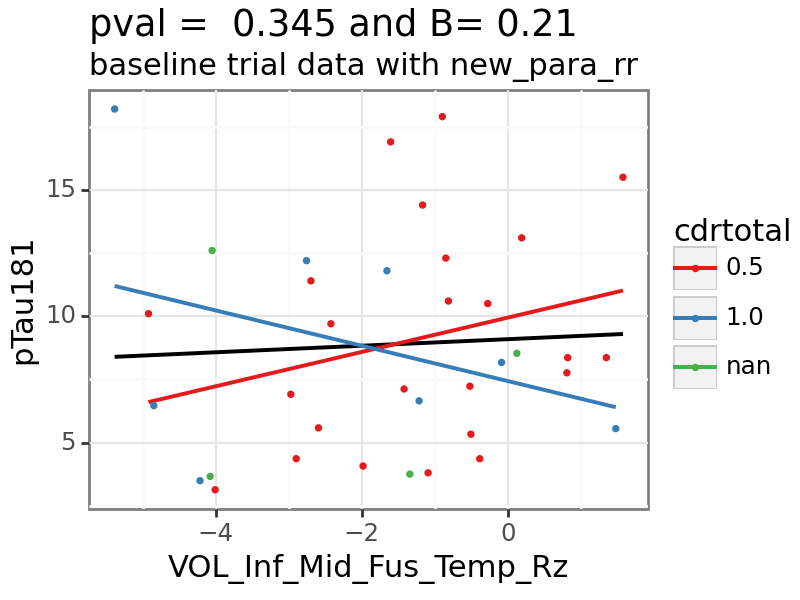

In [58]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data['cdrtotal'] = subset_data['cdrtotal'].astype('str')
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrtotal', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'cdrtotal'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## MMSE

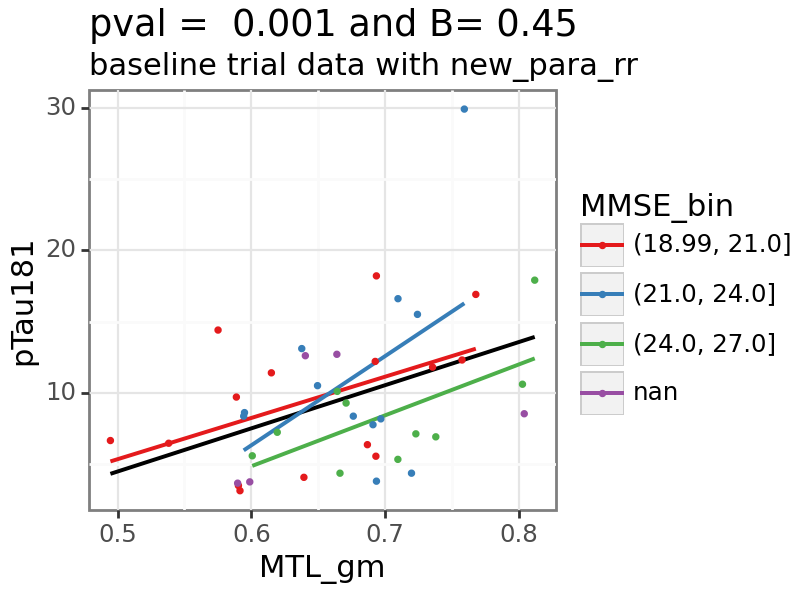

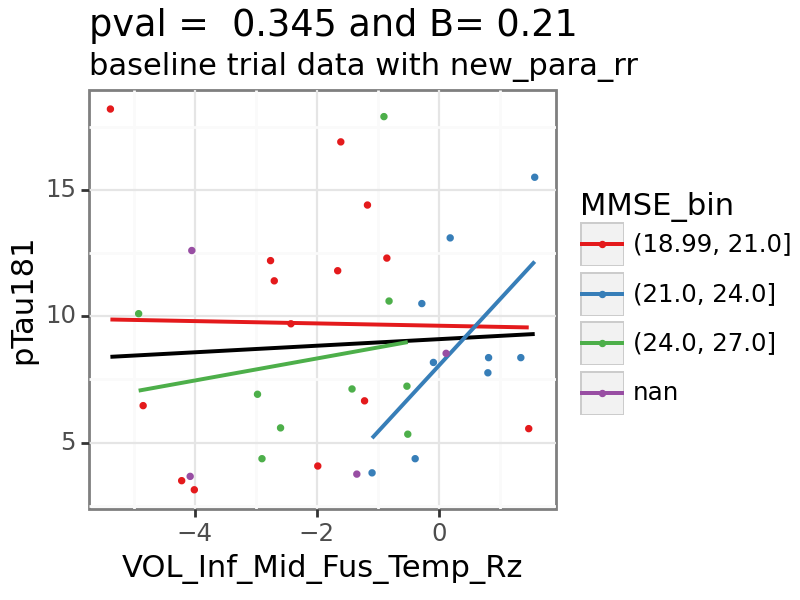

In [59]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('MMSE_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'MMSE_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42/40 

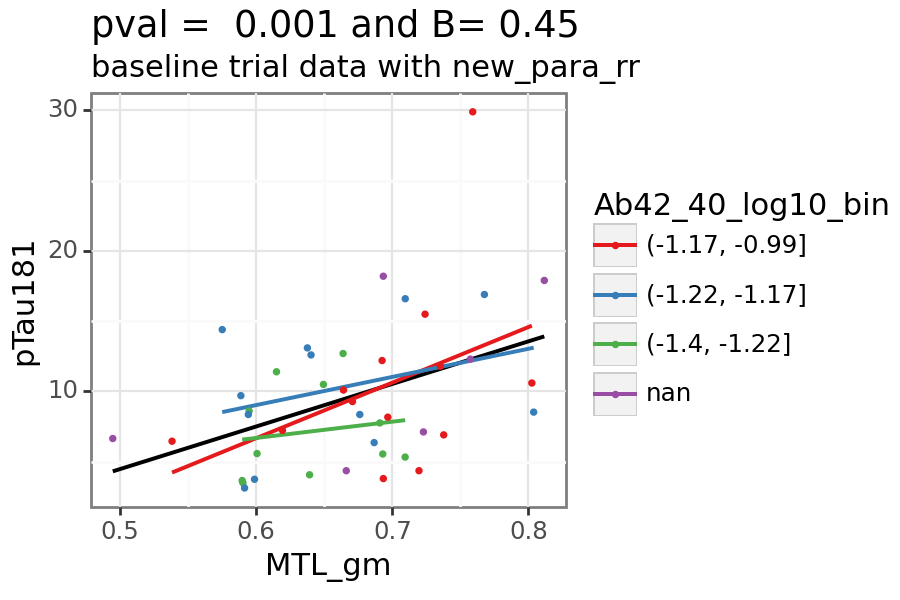

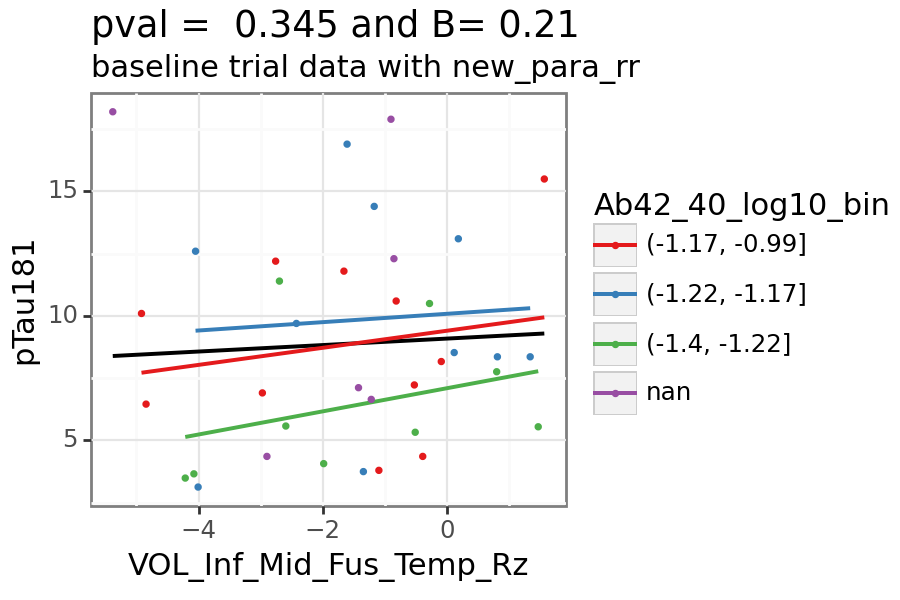

In [60]:
x_var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Ab42_40_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'Ab42_40_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

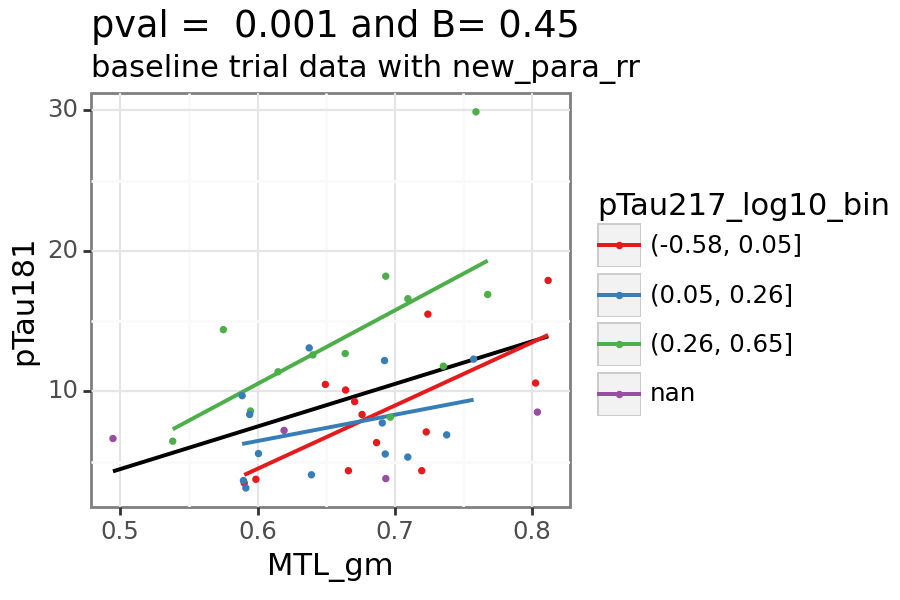

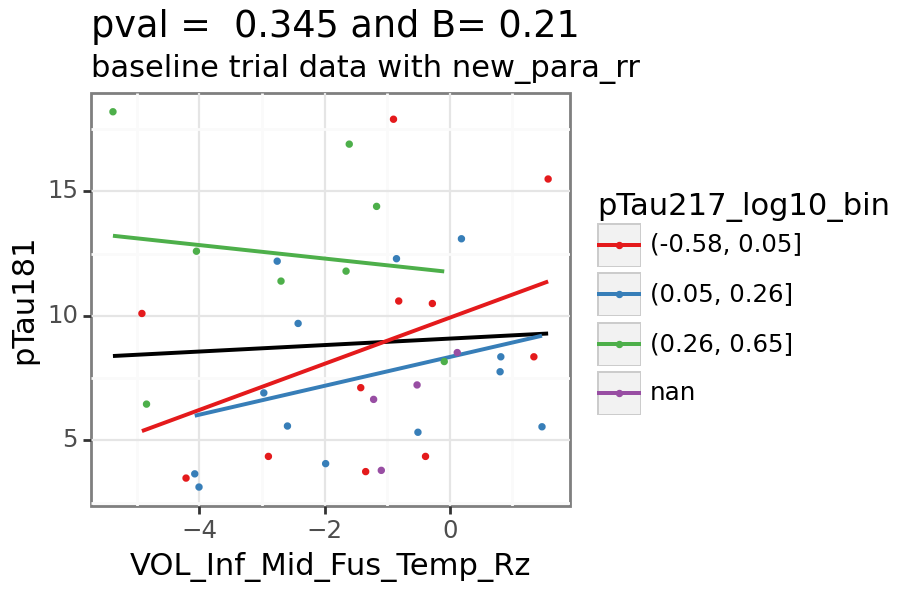

In [61]:
x_var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('pTau217_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'pTau217_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

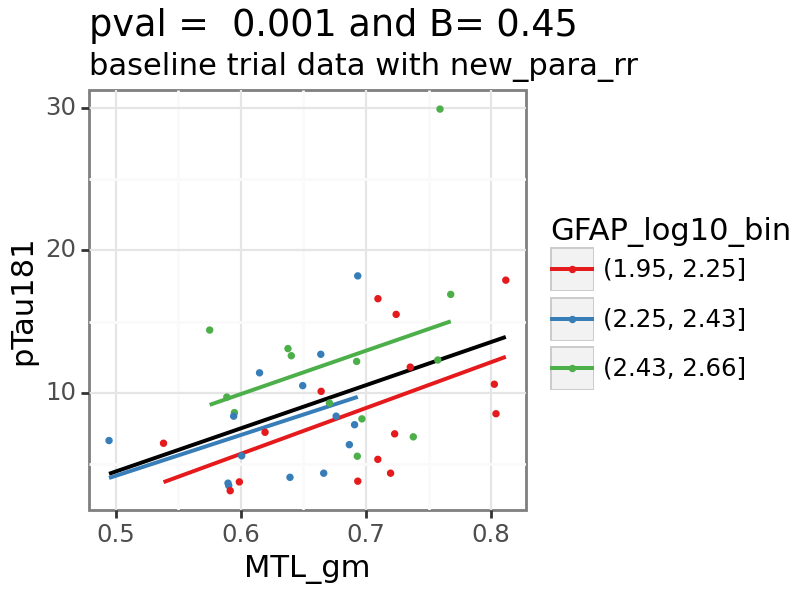

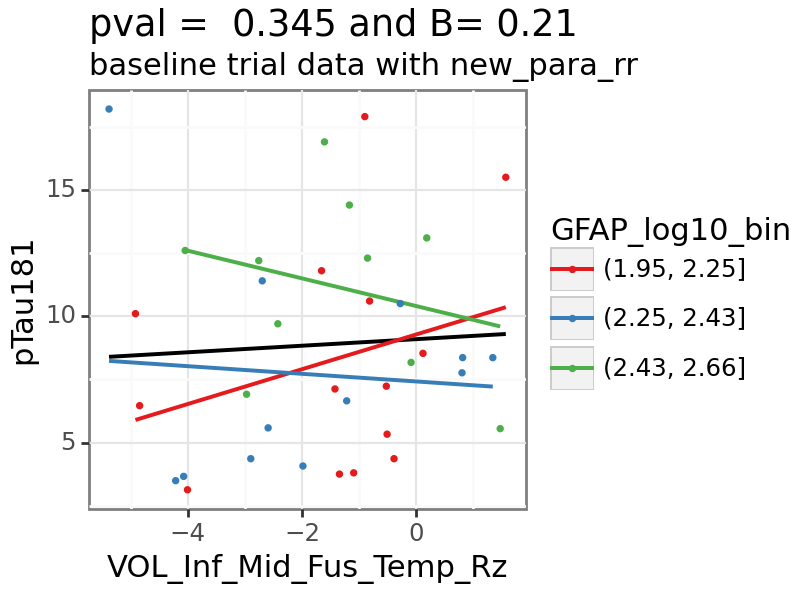

In [62]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('GFAP_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'GFAP_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

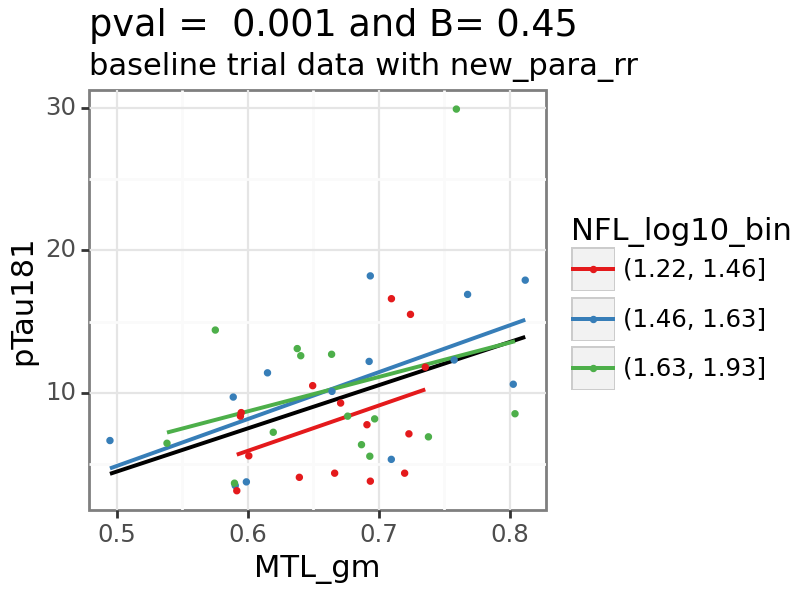

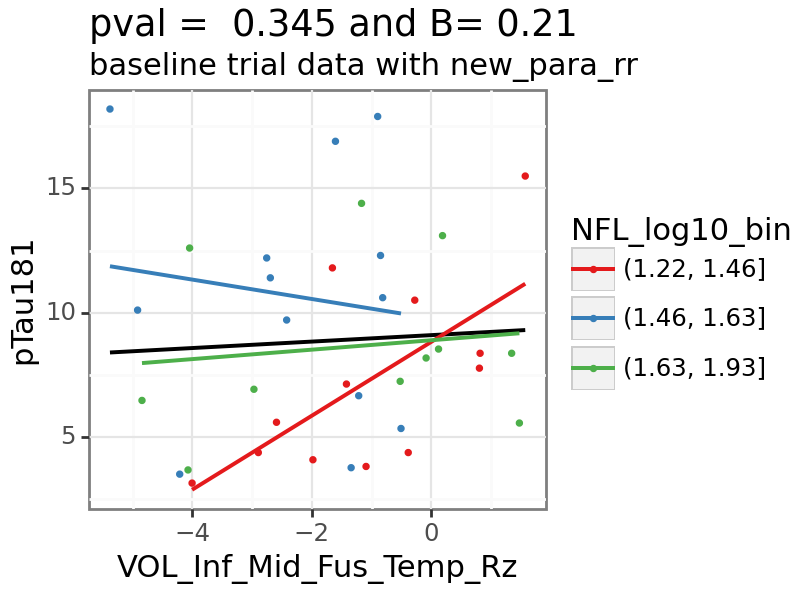

In [63]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('NFL_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'NFL_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Hip Vol

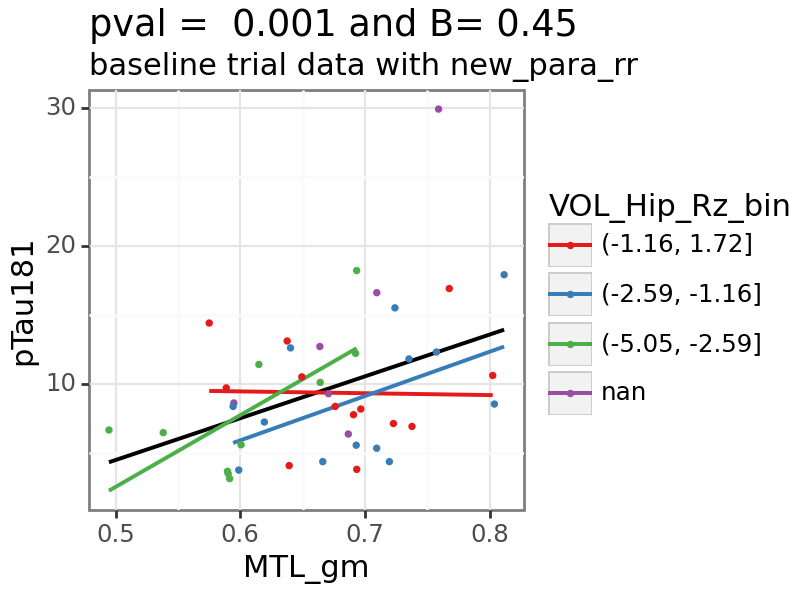

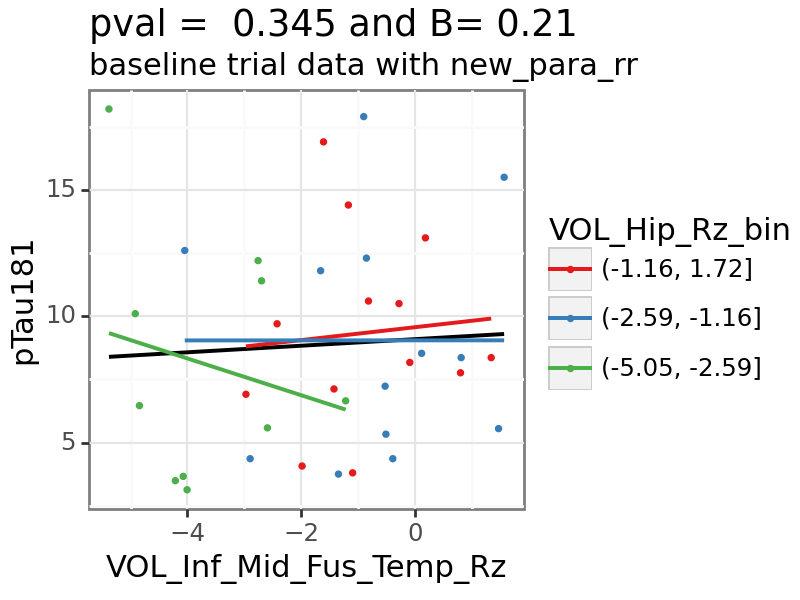

In [64]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  

for y_var in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('VOL_Hip_Rz_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'VOL_Hip_Rz_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot 181 & 231 with separate age decade lines

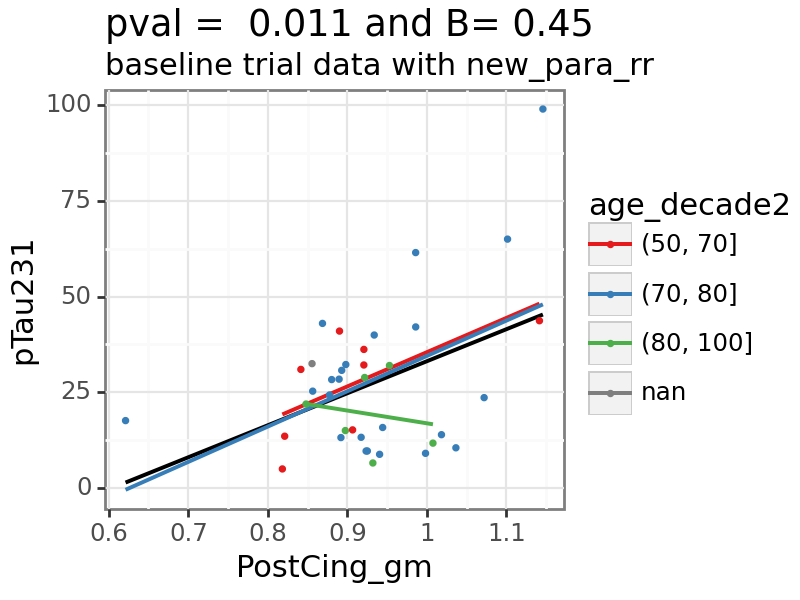

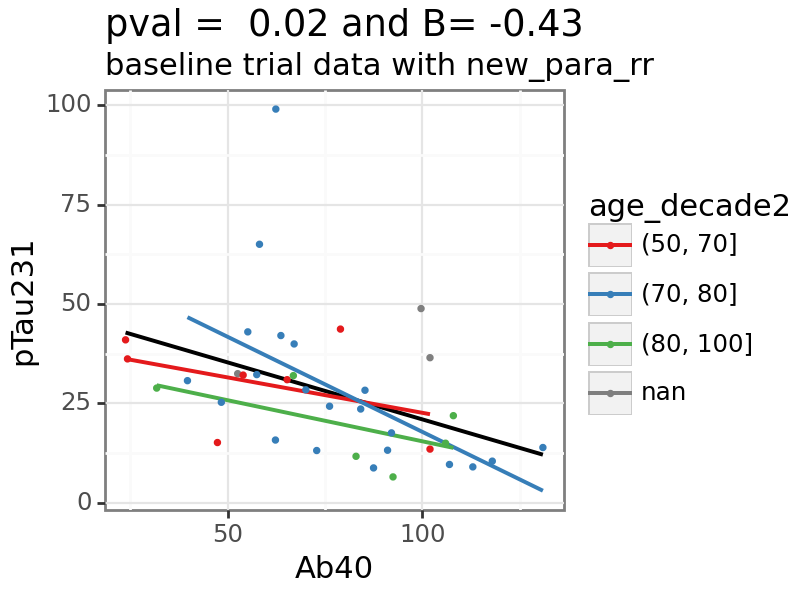

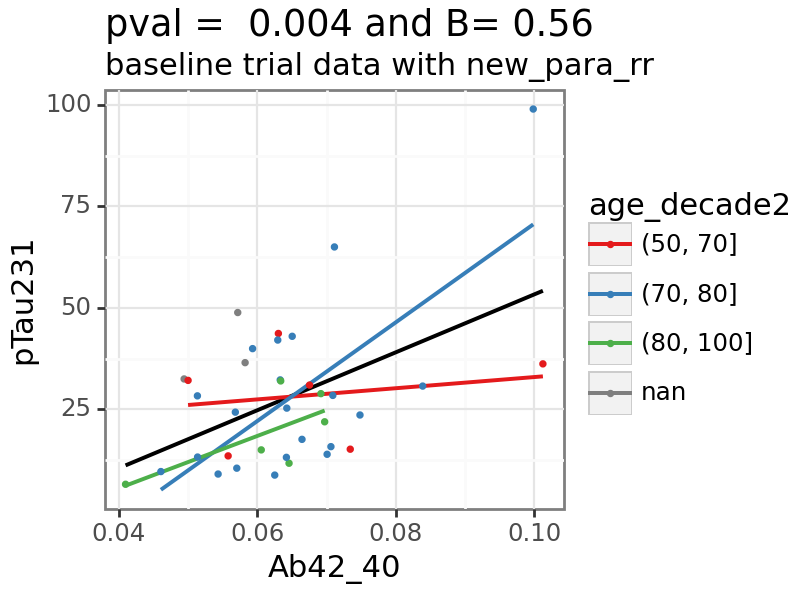

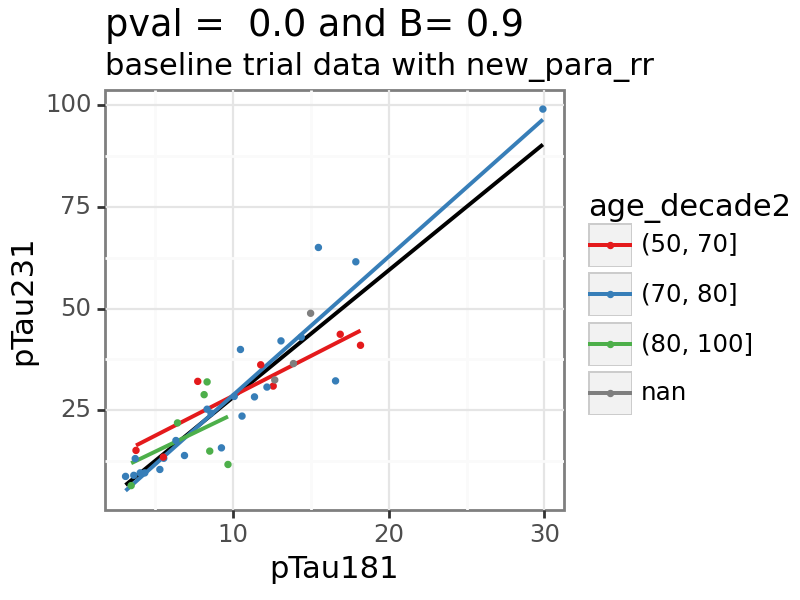

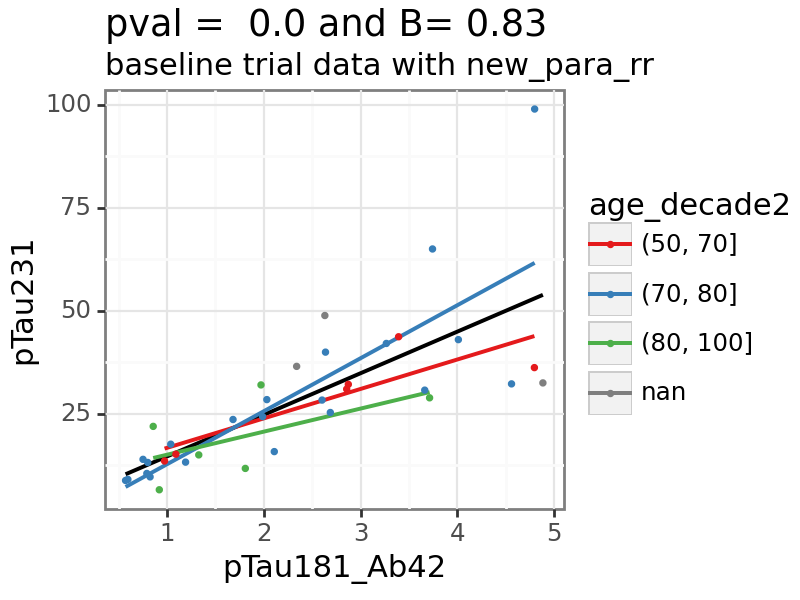

...

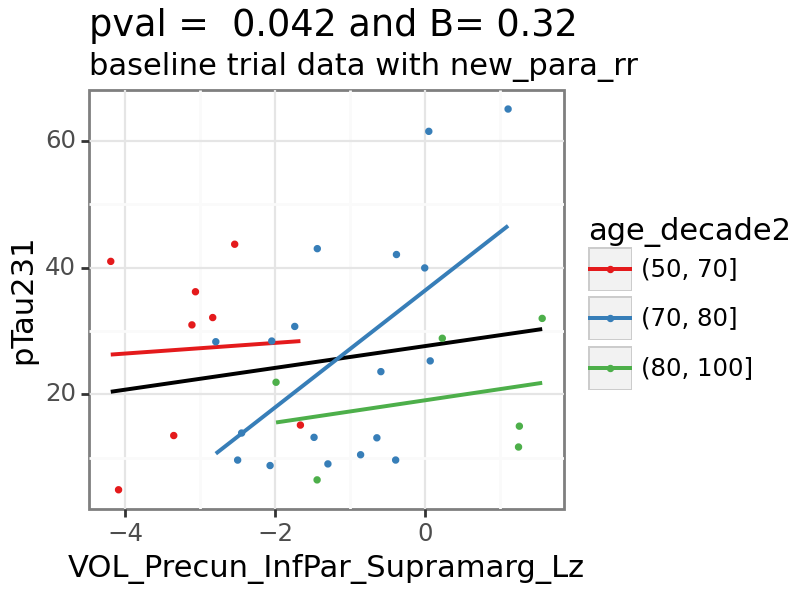

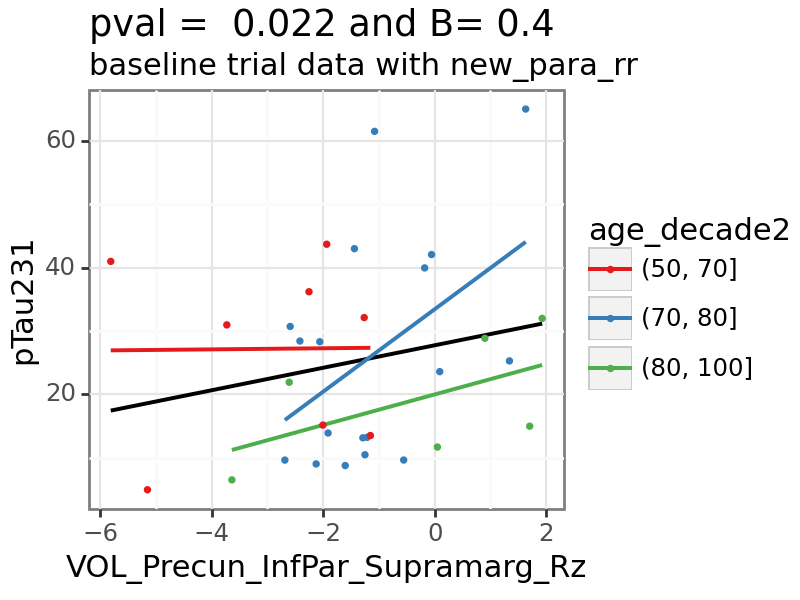

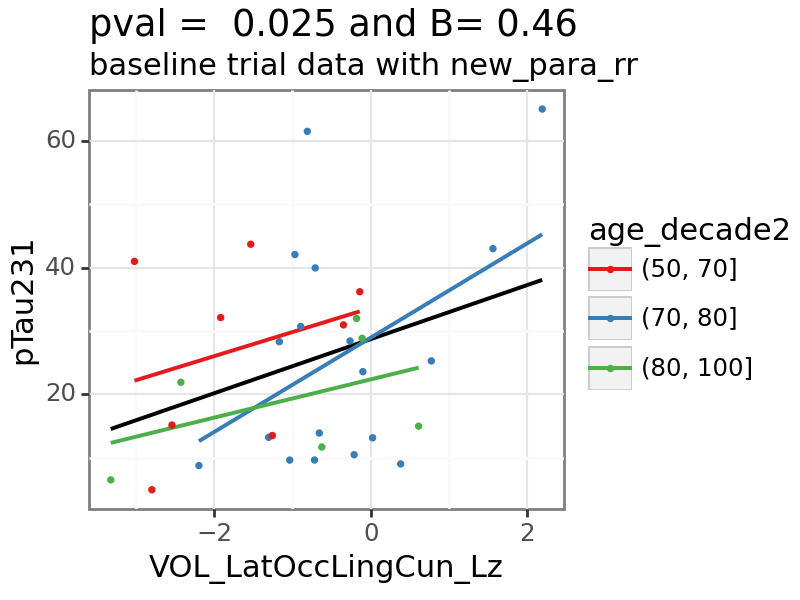

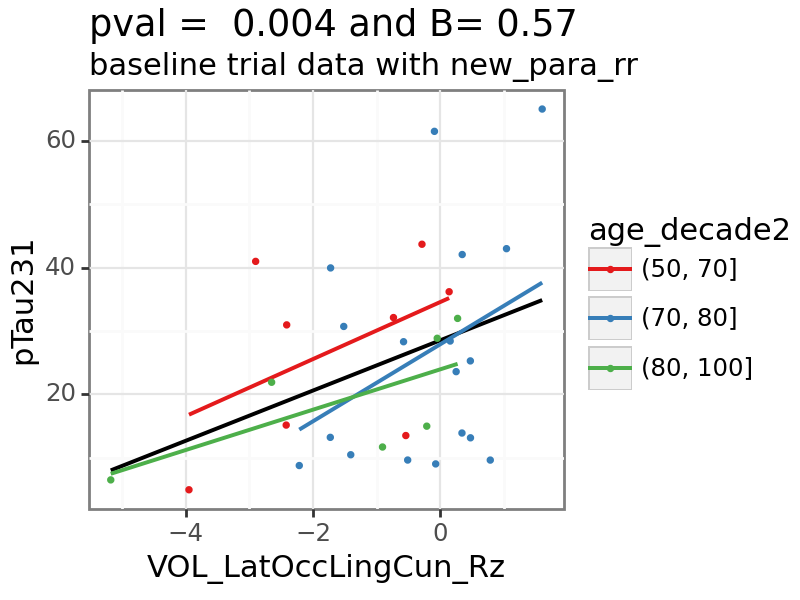

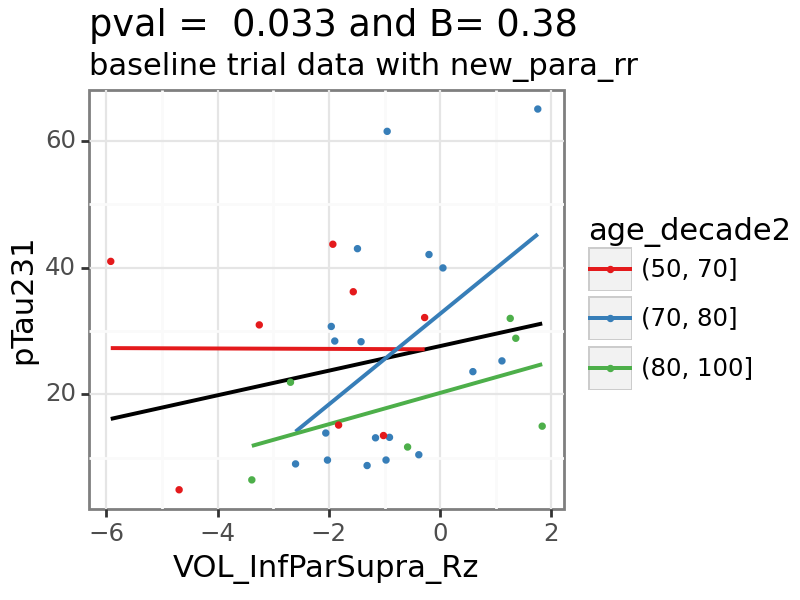

In [65]:
x_var = 'pTau231'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 4)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

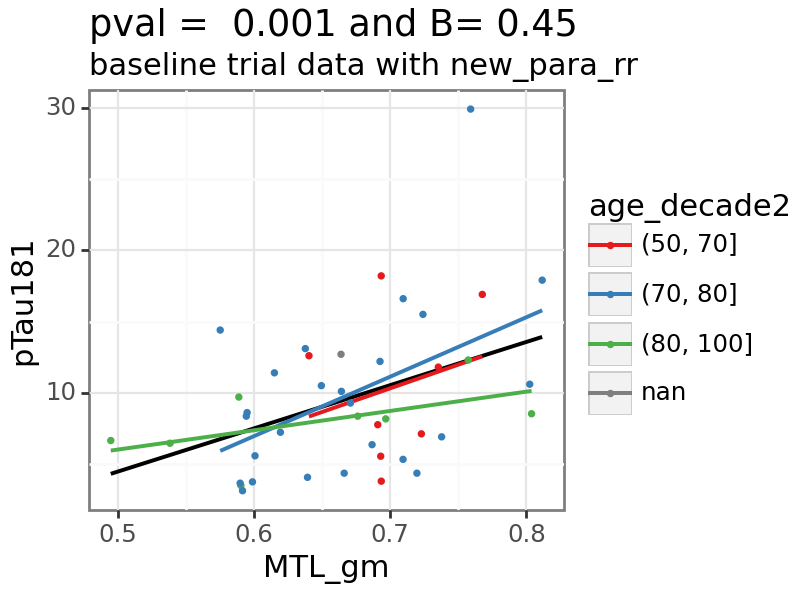

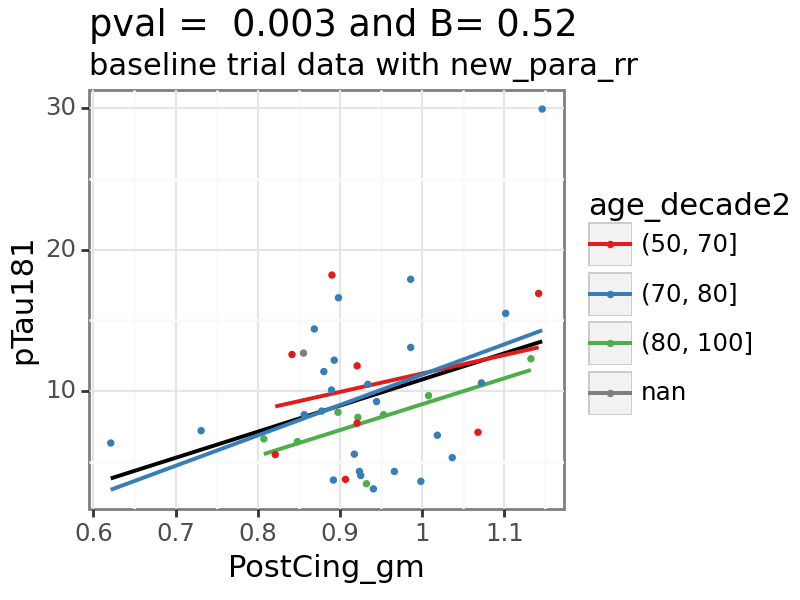

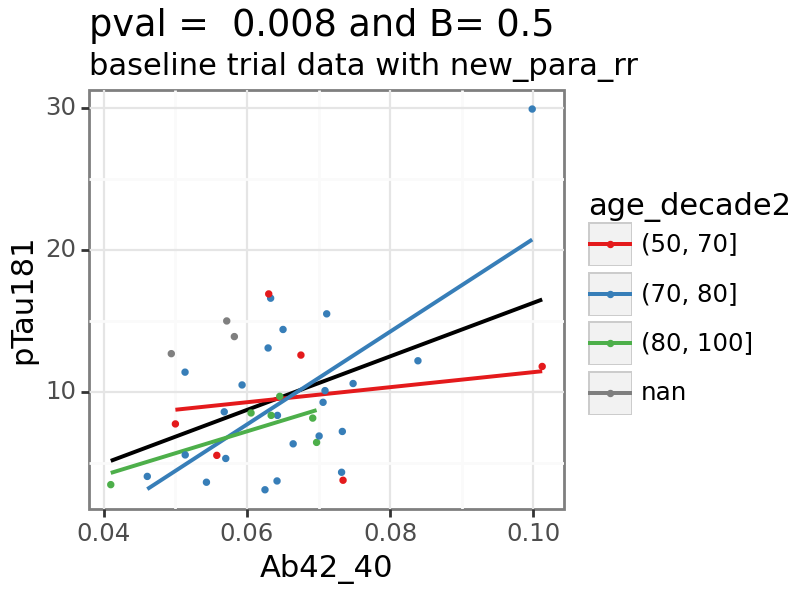

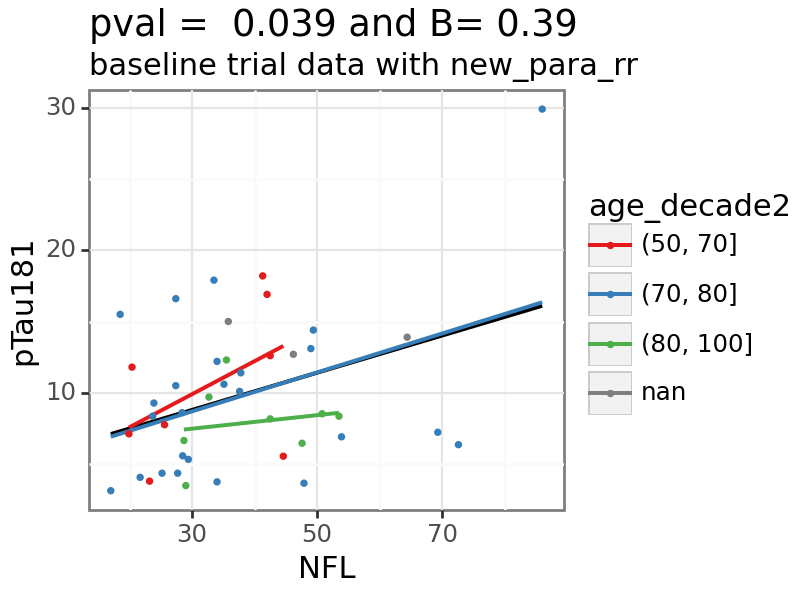

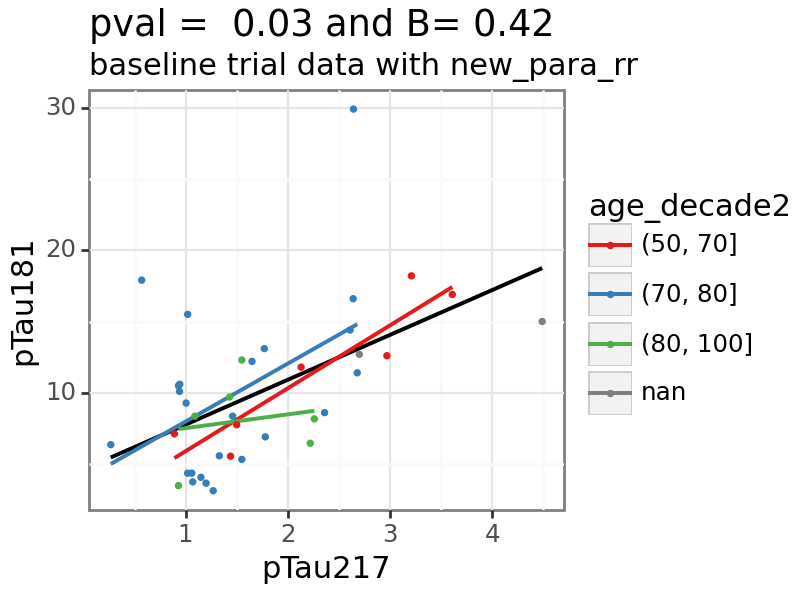

...

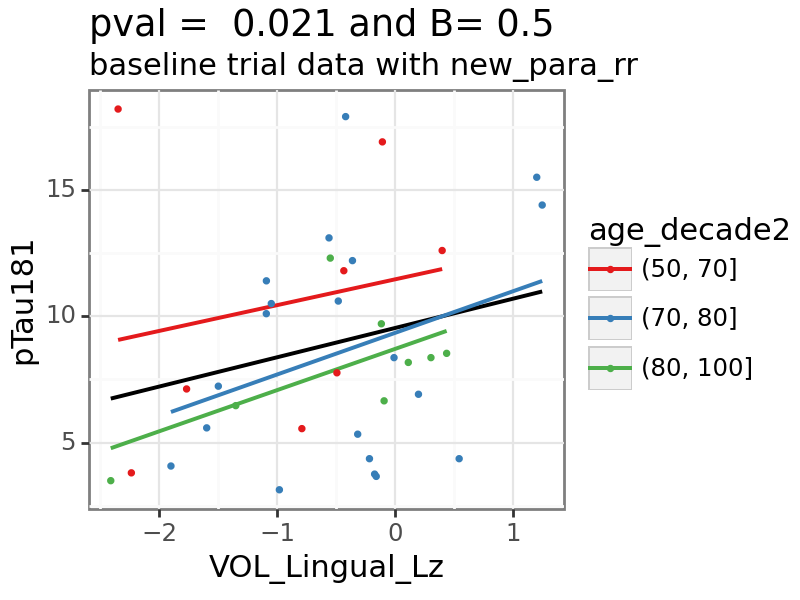

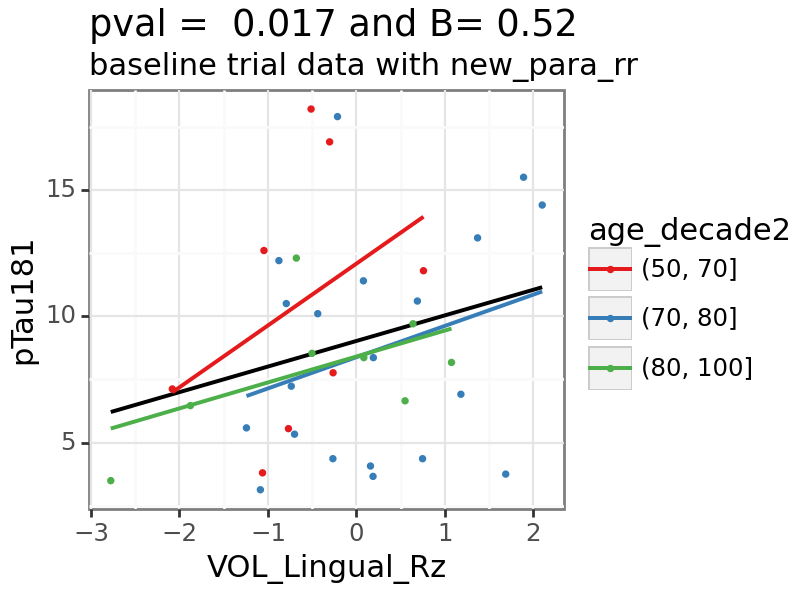

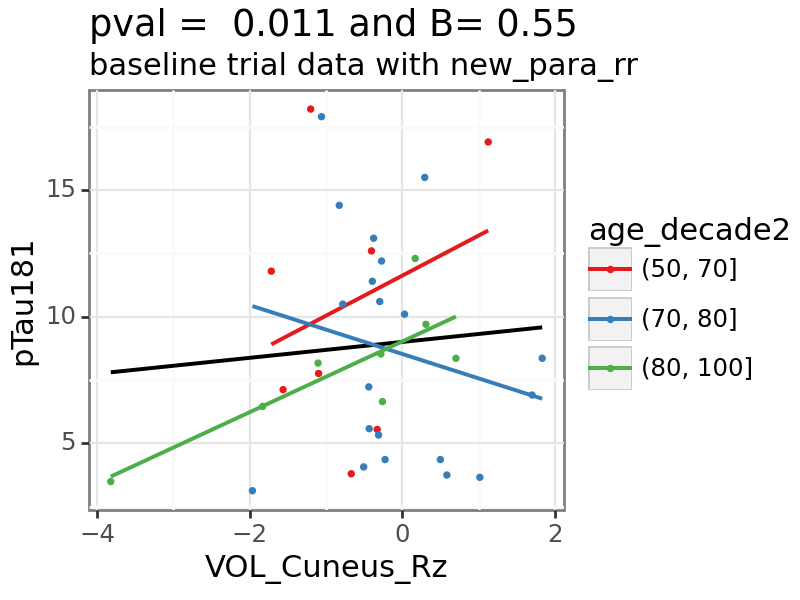

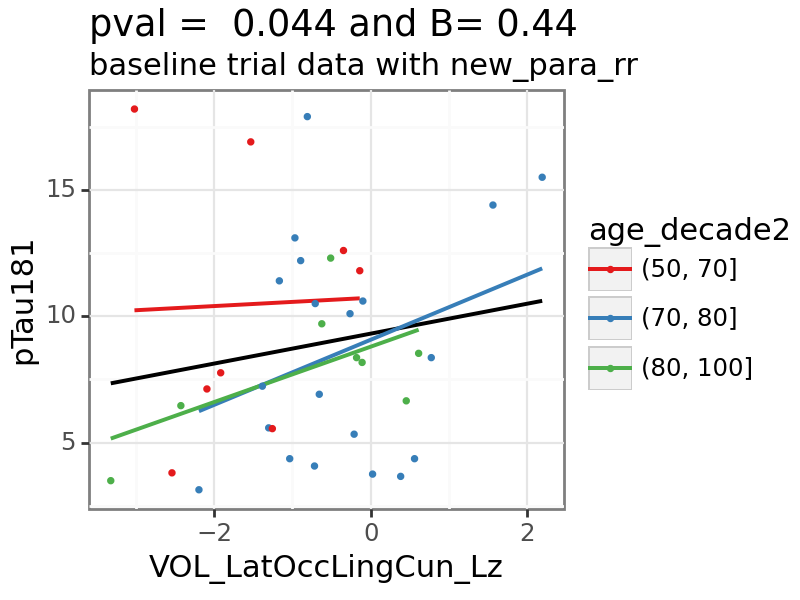

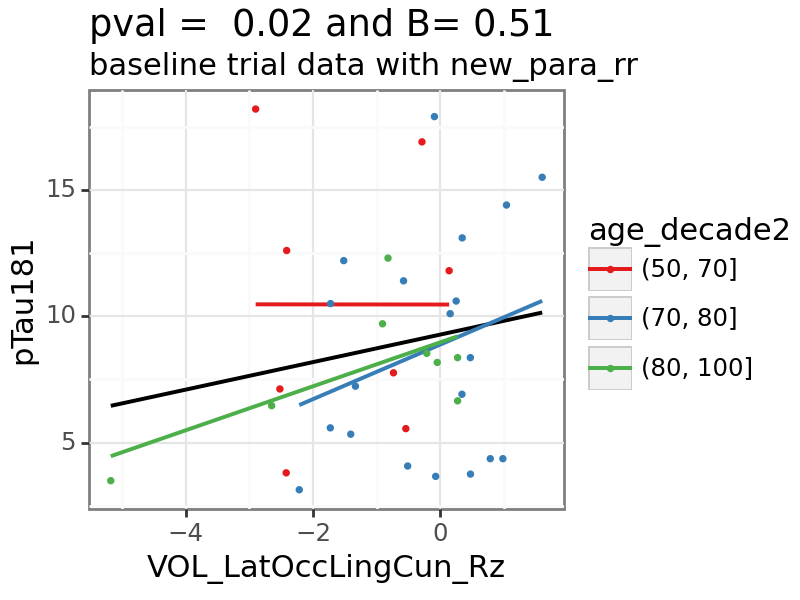

In [66]:
x_var = 'pTau181'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'y_var']


for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 5)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# new

In [67]:
for var in  [ele for ele in FDG_columns if ele in all_data.columns]:

        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [var])

        # z-score data
        temp_df_baseline[ [var] + plasma_columns] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var] + plasma_columns])

        model = smf.ols(formula = var + ' ~ Ab40 + Ab42 + Ab42_40 + GFAP + NFL + pTau181 + pTau217 + pTau231' , data = temp_df_baseline).fit()
        print(var, model.summary(), '\n')

MTL_gm                             OLS Regression Results                            
Dep. Variable:                 MTL_gm   R-squared:                       0.336
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     1.454
Date:                Wed, 28 May 2025   Prob (F-statistic):              0.228
Time:                        16:25:44   Log-Likelihood:                -36.138
No. Observations:                  32   AIC:                             90.28
Df Residuals:                      23   BIC:                             103.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.2572      0.258     -0.996  

c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:1870: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:956: RuntimeWarning: divide by zero encountered in log
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in scalar divide
